# Droplet Oscillation Fast Fourier Transoform Analysis (DOFFTA)

# Importing Modules and Setting MatplotLib Parameters

In [1]:
# importing modules to use
import numpy as np

import pandas as pd

import os

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

from scipy import signal
from scipy.optimize import curve_fit
from scipy.fftpack import fft, fftfreq
from scipy.stats import cauchy
from scipy.special import legendre
from scipy import interpolate
from IPython.display import display, clear_output

import chemicals

# ## MATPLOTLIB PLOTTING PARAMETERS

figure_width = 3 * 160 / 25.4 #conversion to mm is 25.4
figure_height = 3 * 100 / 25.4 #conversion to mm is 25.4
figure_size = (figure_width, figure_height)

resolution = 300 #dpi
tick_size = 18
fontlabel_size = 18


params = {
    'lines.markersize' : 2,
    'axes.labelsize': fontlabel_size,
    'legend.fontsize': fontlabel_size,
    'xtick.labelsize': tick_size,
    'ytick.labelsize': tick_size,
    'figure.figsize': figure_size,
    'xtick.direction':     'in',     # direction: {in, out, inout}
    'ytick.direction':     'in',     # direction: {in, out, inout}
    'axes.spines.top': False,
    'axes.spines.right': False,
    'xtick.major.pad':  8,
    'ytick.major.pad':  8,
    'font.family' : 'serif,',
    'ytick.labelsize' : fontlabel_size,
    'xtick.labelsize' : fontlabel_size,
    'axes.linewidth' : 1.2
}
plt.rcParams.update(params)



# Key Experimental Parameters

In [2]:
T_freezing = 273.15 # K
T_experimental = T_freezing + 20 # K
standard_atmospheric_pressure = 101325 # Pa

def rho_water(T = T_experimental, P = standard_atmospheric_pressure):
    """
    This function returns the density of water based upon the temperature and pressure of the environment.
    'Calculate the density of water in kg/m^3 according to the IAPWS-97 standard.'


    Args:
        T (float): Temperature in K
        P (float): Pressure in Pa

    Returns:
        float: Density of water in kg/m^3
    """
    return np.vectorize(chemicals.iapws.iapws97_rho)(T, P)

def sigma_water(T = T_experimental):
    """
    This function returns the surface tension of water based upon the temperature environment.
    'Calculate the surface tension of pure water as a function of temperature. Assumes the 2011 IAPWS formulation.
    Reference: Somayajulu, G. R. “A Generalized Equation for Surface Tension from the Triple Point to the Critical Point.” International Journal of Thermophysics 9, no. 4 (July 1988): 559-66. doi:10.1007/BF00503154.'

    Args:
        T (float): Temperature in K

    Returns:
        float: Surface tension of water in N/m
    """
    return np.vectorize(chemicals.interface.sigma_IAPWS)(T)

def mu_water(T = T_experimental, P = standard_atmospheric_pressure):
    """
    This function returns the viscosity of water based upon the temperature and  pressure of the environment.
    
    Args:
        T (float): Temperature in K
        P (float): Pressure in Pa

    Returns:
        float: Viscosity of water in Pa.S
    """
    return np.vectorize(chemicals.viscosity.mu_IAPWS)(T, rho_water(T,P))


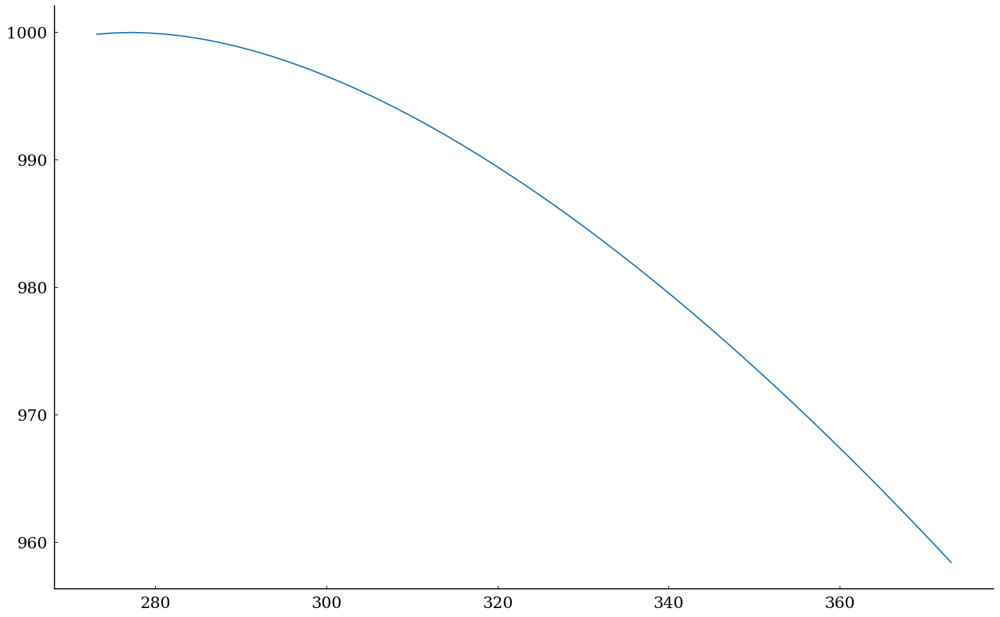

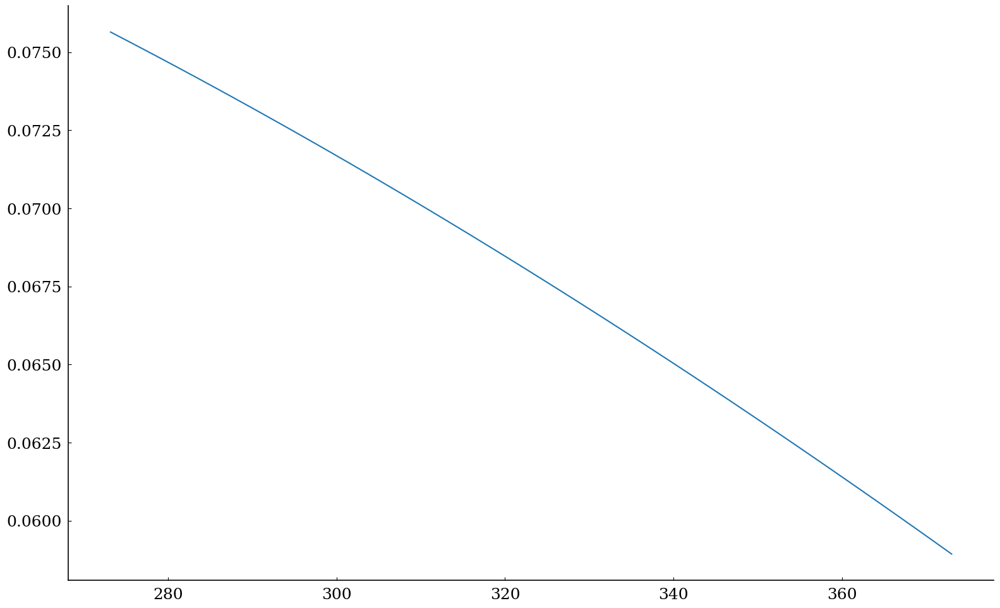

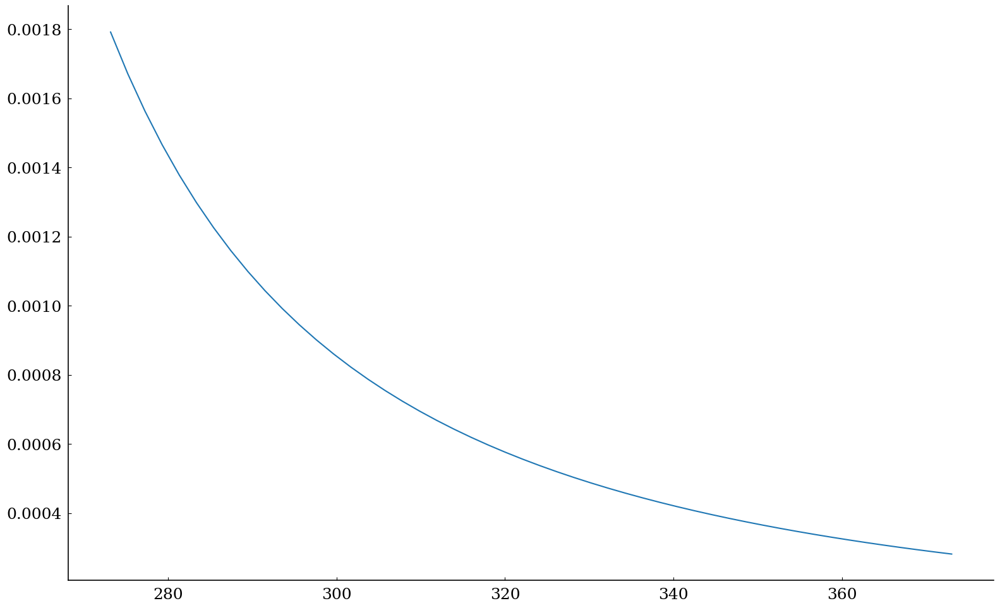

In [3]:
#testing the functions that describe the properties of water
test_T_range = np.linspace(T_freezing, T_freezing + 99.9)
for function in [rho_water,sigma_water, mu_water]:
    plt.plot(test_T_range, function(test_T_range))
    plt.show()

# DOFFTA Functions

## Data Import, Review & Clean

In [4]:
# ## DATA IMPORT, REVIEW & CLEAN

def import_data(filepath):
    
    """
    Imports data from instrument, drops nan rows and adds column names.
    Returns dataframe of experimental data
    
    Args:
        filepath (str): location of data file.
    
    Returns:
        pandas.core.frame.DataFrame: Experimental Data
    """
    
    #column names of the data files
    column_names = ['time_s', 'x1', 'x2', 'x3', 'aspect_ratio', 'diameter_um', 'x4', 'centre_offset_x', 'centre_offset_y']

    #read data
    df =  pd.read_csv(filepath,
                      sep = '\t',
                      header=None,
                      names=column_names)

    df.dropna(inplace = True)
    
    return df

def review_data(df):
    '''given a df in the with columns:
        time_s	x1	x2	x3	aspect_ratio	diameter_um	x4	centre_offset_x	centre_offset_y
    this will plot  diameter, aspect ratio and 2 centre offsets for this data over time for user to review'''
    
    fig = plt.figure(figsize = (19,17))
    gs = fig.add_gridspec(2, 2,hspace=0.2, wspace=0.1)

    ((ax1, ax2), (ax3, ax4)) = gs.subplots(sharex='col')

    ax1.plot(df.time_s/1e-6,df.diameter_um, '#785EF0')
    ax2.plot(df.time_s/1e-6,df.aspect_ratio, '#DC267F')
    ax3.plot(df.time_s/1e-6,df.centre_offset_x, '#FE6100')
    ax4.plot(df.time_s/1e-6,df.centre_offset_y, '#FFB000')

    ax1.set_title( 'Diameter / µm')
    ax2.set_title( 'Aspect Ratio / µm')
    ax3.set_title( 'Centre offsett x / pixels')
    ax4.set_title( 'Centre offsett y / pixels')

    ax3.set(xlabel = 'Time / µs')
    ax4.set(xlabel = 'Time / µs')

    plt.show()
    
    return

In [5]:
def remove_unecessary_data(df, aspect_ratio_limit = 5, end_time_limit = 1):
    """
    Takes experimental data df and removes data outside of use defined aspect ratio and final time limit
    
    Args:
        df (pandas.core.frame.DataFrame): original experimental data
        
    Returns:
        pandas.core.frame.DataFrame: Trimmed data
    """
    
    df = df.loc[df.aspect_ratio < aspect_ratio_limit]
    
    df.reset_index(inplace = True, drop = True)

    df = df.loc[df.time_s < end_time_limit]
    
    return df

## Rolling Average

In [6]:
# ## ROLLING AVERAGE FUNCTION

def rolling_average(data, window):
    """
    Rolling average function that uses padding to avoid clipping of data.
    This function ensures that the minumum window siz used is 5 and the window is an odd number for centered rolling windonws.
    Returns series of rolling average
    
    Args:
        data (pandas.core.series.Series): data to be smoothed
        window (int): window width
        
    Returns:
        pandas.core.series.Series: smoothed data
    """
    if window % 2 == 0:
        window += 1
    if window < 4:
        window = 5

    edge_width = int((window - 1) / 2)
        
    s = pd.DataFrame(np.pad(data, edge_width, mode = 'edge'))
    s = s.rolling(window, center = True).mean()
    s = s.iloc[edge_width : - edge_width]
    s.reset_index(drop = True, inplace = True)
    return s.iloc[:,0].values


def data_cleaning(df):
    '''Dummy function returning same df as received, in place for any future developments of cleaning.
    It is essential that any cleaning method maintains spacing of data for FFT. Otherwise new FFT method will be required:
    https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.lombscargle.html'''
    
    return df

def review_clean_data(df, df_clean):
    '''
    Takes experimental data and cleaned data and plots both for comparison
        
    Args:
        df (pandas.core.series.Series): Data that has not been cleaned
        df_clean (pandas.core.series.Series): Data that has been cleaned

    Returns:
        Nothing
    """
    '''
    #review selected data
    plt.scatter(df.time_s/1e-6, df.diameter_um, s = 15, c = 'k')
    plt.scatter(df_clean.time_s/1e-6, df_clean.diameter_um, c = 'r', s = 3)

    rolling_window = 5
    #rolling average data
    plt.plot(rolling_average(df_clean.time_s,rolling_window)/1e-6, rolling_average(df_clean.diameter_um, rolling_window), c= 'k')

    plt.ylabel('Diameter$_{horizontal}$ / µm')
    plt.xlabel('Time / µs')
    plt.show()

    return

## Peak Location

In [7]:
# ## PEAK LOCATION

def find_peaks(xdata, ydata, window_points):
    
    """
    Takes arrays of x and y data and a window size. Finds peaks within rolling window and
    returns x and y data of peaks and troughs
    
    Args:
        xdata (np.array): time data 
        xdata (np.array): amplitude data 
        window_points: window width in data points within which to search for peaks
        
    Returns:
        np.arrray: array of time points of peaks
        np.arrray: array of amplitude points of peaks
    """
        
    peaks = []
    for i in range(n, len(ydata) - n):
        if ydata[i-n:i+n].max() == ydata[i]:
            peaks.append(i)
            
    troughs = []
    for i in range(n, len(ydata) - n):
        if ydata[i-n:i+n].min() == ydata[i]:
            troughs.append(i)

    peaks_and_troughs = np.sort(np.hstack([peaks, troughs]))
    

    return xdata[peaks_and_troughs], ydata[peaks_and_troughs]

## Diameter Calibration

In [8]:
# ## DIAMETER CALIBRATION

def get_calibrated_diameter(df, equilibrium_data_points = 100):
    """
    Function to find a calibration for image blur. Also retreived equlibrium properties of droplet.
    Takes experimental data and calculates diamter correction based uppon:
    Blur_width = (width_observed/AR) - width_observed
    Assumes that the equillibrium_data_points are at final equillibrium shape/size
    
    Args:
        df (pd.core.frame.DataFrame): experimental data
        equilibrium_data_points (int): number of datapoints to be considered as final equlibrium period.
        
    Returns:
    float: width_final
    float: width_final_std
    float: AspectRatio_final
    float: width_correction
    float: width_calibrated
    float: A_0_calculated
    
    """

    width_final = df.diameter_um.tail(equilibrium_data_points).mean() * 1e-6
    width_final_std = df.diameter_um.tail(equilibrium_data_points).std() * 1e-6
    AspectRatio_final = df.aspect_ratio.tail(equilibrium_data_points).mean()

    width_correction = (width_final/AspectRatio_final - width_final)
    width_calibrated = width_final + width_correction
    
    A_0_calculated = (df.diameter_um.values[0]/1e6 - width_final) / 2 
    
    '''print('Measured final diameter / µm = ' + str(round(1e6* width_final,3)) + '\nCalculated diameter error / µm = ' + str(round(1e6*width_correction,3)) + '\nCalculated final diameter / µm = ' + str(round(1e6*width_calibrated,3)))'''

    
    return width_final, width_final_std, AspectRatio_final, width_correction, width_calibrated, A_0_calculated

def get_calibrated_data(df, diameter_correction):
    '''Takes experimetnal data and blur corrction and adds this to all the diameter values
    Returns calibrated data df'''
    
    df_calibrated = df.copy()
    df_calibrated.diameter_um = df_calibrated.diameter_um + diameter_correction*1e6
    
    return df_calibrated

## Fast Fourier Tranform

In [9]:
# ## FFT

def get_fft(x_data, y_data, lower_frequency_cutoff = 7000):
    """
    Takes x and y arrays and performs fft.
    Returns FFT in df of freq and amplitude without any values of freq lower than specified cut off
    
    Args:
        xdata (np.array): time data 
        xdata (np.array): amplitude data 
        lower_frequency_cutoff: value bewlow which frequency data is removed
        
    Returns:
        pd.core.frame.DataFrame: dataframe of fft data with a frequency and amplitude column
    """
    
    yf = np.abs(fft(y_data))

    N = len(y_data)
    duration = x_data.max() - x_data.min()
    sample_rate = N / duration
    
    xf = fftfreq(N, 1/sample_rate)
    
    df = pd.DataFrame({'frequency' : xf, 'amplitude' : yf})
    
    df = df.loc[(df.frequency > lower_frequency_cutoff) & (df.frequency < 100000)  ]
    return df


## Fitting Lorentzian Function to Data

In [10]:
# ## LORENTZIAN FITTING

def lorentzian_fit_func(x_data, scale, offset, width, vert_offset):
    
    """
    Describes Lorentzian function with a vertical offset
    
    Args:
        x_data (np.array): range over which to apply to the lorrentzian function
        scale (float): coefficient that scales the amplitude of the output
        offset (float): coefficient by which the function is shifted in the x direction
        width (float): coefficient that determines the width of the distribution
        vert_offset (float): coefficient by which the function is shifted in the x direction
    """
    
    dist = cauchy(offset, width)
    return scale * dist.pdf(x_data) + vert_offset

def get_lorentzian_fit(frequency_data, frequency_amplitude):
    """
    Takes FFT data and returns fitted function, as a data set and as a list of parameters'with errors.
    If fit failes, returns no data and params of zeros
    
    Args:
        frequency_data (np.array): array of time data from FFT
        frequency_amplitude (np.array): array of aplitude data from FFT
        
    Returns:
        np.array: range of frequency over which fit has been applied with 1000 datapoints
        np.array: amplitude of data over 
        np.array: lorentzian fit parameters, zero if fit fails
        np.array: lorentzian fit parameter errors, zero if fit fails
    """
    
    fit_freq_range = np.linspace(frequency_data.min(),frequency_data.max(),1000)
    
    try:
        lorentzian_parameters, lpcov = curve_fit(lorentzian_fit_func,
                                       frequency_data,
                                       frequency_amplitude,
                                       p0 = [10,40e3,10e3,0],
                                       bounds = ([1,10e3,1, -50],
                                                 [1e6,100e3,100e3, 50]))

        fitted_lorentzian = lorentzian_fit_func(fit_freq_range, *lorentzian_parameters)
        
        lorentzian_parameters_errors = np.sqrt(np.diag(lpcov))
        
        return fit_freq_range, fitted_lorentzian, lorentzian_parameters, lorentzian_parameters_errors
    
    except:
        print ('failed to fit! review data!')
        return frequency_data, frequency_amplitude, np.array([0,0,0,0]), np.array([0,0,0,0])

## Calculating Surface Tension

In [11]:
# ## CALCULATE SURFACE TENSION

def calc_suraface_tension(R_0, density, frequency, n):
    """
    Calculates surface tension, given equilibrium raidus, droplet density, peak frequency and mode order
    
    Args:
        R_0 (float): Equilibrium radius in meters
        density (float): density of oscillating droplet
        frequency (float): Frequency of oscillation
        n (int): mode order of oscillations
    
    Returns:
        float: surface tension in N/m
    """
    
    return ((R_0**3)*(density)*(frequency**2)) / (n*(n-1)*(n+2))

def calc_suraface_tension_err_r(equilibrium_radius, density, peak_frequency, n = 2):
    
    """
        Calculates surface tension uncertainty, given equilibrium raidus, droplet density, peak frequency uncertainty and mode order
    
    Args:
        equilibrium_radius (float): Equilibrium radius in meters
        density (float): density of oscillating droplet
        peak_frequency (float): Frequency of oscillation uncertainty
        n (int): mode order of oscillations
    
    Returns:
        float: surface tension in N/m
    """
    
    return (3 * equilibrium_radius ** 2 * density * peak_frequency** 2) / (n*(n-1)*(n+2))


def calc_suraface_tension_with_correction(R_0, density, viscosity, frequency, n):
    '''
    ###Currently doesnt work###
    Calculates surface tension, given equilibrium raidus, droplet density, peak frequency and mode order.
        Includes 'viscosity correction' of w_obs^2 = w_n^2 - B_n^2
    '''
    return ((density * R_0 **3)/(n * (n-1) * (n+1)) * (frequency + (((n-1)**2 * (2*n + 1)**2 * viscosity**2)/(density**2 * R_0**6))))

# ## FIND X OF PEAK Y IN DATASET

def get_peak_frequency(x,y):
    """
    Takes x and y arrays and returns x value of peak y
    
    Args:
        x (np.array): x data
        y (np.array): y data
        
    Returns:
        np.array: x values corresponding to max y values
    """
    return x[np.argmax(y)]


## Indentifying and Removing High Order (n > 2) Oscillations

In [12]:
# ## IDENTIFY AND REMOVE HIGH ORDER MODES

def remove_high_order_data(df, rolling_average_window, offset_limit = 3.5):
    
    """
    Takes experimental data df, finds equilibrium value and std dev.
    Returns data where rolling average is within limit
    
    Args:
        df (pd.core.frame.Dataframe): experimental data
        rolling_average_window (int): window width to use in rolling average
        offset_limit (float): number of standard deviations of equlibrium value within which oscillation data must not exeed
    
    Returns:
        pandas.core.series.Series: time series data
        pandas.core.series.Series: data series of oscillation of centre offset
        float: Centre offset mean
        float: Centre offset std. dev.
    """
    
    
    C_offset_x_std = np.std(rolling_average(df.centre_offset_x, rolling_average_window)[-250:])
    C_offset_x_mean = np.mean(rolling_average(df.centre_offset_x, rolling_average_window)[-250:])
    
    offset_data = rolling_average(df.centre_offset_x,rolling_average_window)[(rolling_average(df.centre_offset_x,rolling_average_window) > C_offset_x_mean+offset_limit*C_offset_x_std) | (rolling_average(df.centre_offset_x,rolling_average_window) < C_offset_x_mean-offset_limit*C_offset_x_std)]
    time_data = rolling_average(df.time_s,rolling_average_window)[(rolling_average(df.centre_offset_x,rolling_average_window) > C_offset_x_mean+offset_limit*C_offset_x_std) | (rolling_average(df.centre_offset_x,rolling_average_window) < C_offset_x_mean-offset_limit*C_offset_x_std)]
    
    return time_data, offset_data, C_offset_x_mean, C_offset_x_std

# ## GETTING TRIMMED DATA

def review_centre_offset(df, average_window = 11, save_figures = 'n', save_location = 'NaN'):
    '''Takes Experimental data df.
    Returns only second order data in trimmed df after reviewing and seeking user confirmation.
    Saves figures by default.
    
    Returns:
        pandas.core.series.DataFrame: experiemental data with early, high order mode data excluded
    '''
    centre_offset_equilib = remove_high_order_data(df, average_window)[2]
    centre_offset_std = remove_high_order_data(df, average_window)[3]
    
    centre_offset_figure, ax = plt.subplots()

    #raw data
    ax.scatter(df.time_s/1e-6, df.centre_offset_x, s = 1, c = 'purple', label = 'x offset' )
    ax.scatter(df.time_s/1e-6, df.centre_offset_y, s = 1, c = 'orange', label = 'y offset' )
    
    #values outside threshold
    ax.scatter(remove_high_order_data(df,average_window)[0]/1e-6,
                remove_high_order_data(df,average_window)[1],
                s = 50, marker = 's', c = 'violet')

    #smoothed data
    ax.plot(rolling_average(df.time_s/1e-6, average_window),
            rolling_average(df.centre_offset_x,average_window),
            lw = 3, c = 'purple', label = 'rolling average x' )
    ax.plot(rolling_average(df.time_s/1e-6, average_window),
            rolling_average(df.centre_offset_y, average_window),
            lw = 1, c = 'orange', label = 'rolling average y' )
    
    ax.axhline(centre_offset_equilib, c = 'darkviolet')
    ax.axhspan(centre_offset_equilib-centre_offset_std, centre_offset_equilib+centre_offset_std, color = 'darkviolet', alpha = 0.2)
    ax.axhspan(centre_offset_equilib-2*centre_offset_std, centre_offset_equilib+2*centre_offset_std, color = 'darkviolet', alpha = 0.2)
    ax.axhspan(centre_offset_equilib-3*centre_offset_std, centre_offset_equilib+3*centre_offset_std, color = 'darkviolet', alpha = 0.2)
    ax.axhspan(centre_offset_equilib-3.5*centre_offset_std, centre_offset_equilib+3.5*centre_offset_std, color = 'darkviolet', alpha = 0.2)

    ax.xaxis.set_minor_locator(MultipleLocator(20))

    plt.grid(True, 'major', 'x')
    plt.grid(True, 'minor', 'x', linestyle = ':')
    plt.ylabel('Centre Offset')
    plt.xlabel('Time / µs')
    plt.ylim(-3,3)

    ax.legend()
    plt.show()
    
    #calculate end of 3rd+ order modes
    calculated_high_order_cut_off = remove_high_order_data(df,average_window)[0].max()
    print('Calculated cut off (µs): ' + str(round(calculated_high_order_cut_off * 1e6,2)))
    print('Is this cut off sensible? \n\nIf yes, press enter. \n\nIf no, enter a suggested value below (in µs):')

    suggested_cut_off = input()
    
    if suggested_cut_off  == '':
        high_order_cut_off = calculated_high_order_cut_off
    else:
        high_order_cut_off = float(suggested_cut_off)/1e6
        
    df_trimmed  = df.loc[df.time_s > high_order_cut_off].copy()
    
    fig_c_offset_cutoff, ax = plt.subplots()

    #data
    ax.scatter(df.time_s/1e-6, df.centre_offset_x, s = 1, c = 'purple', label = 'x offset' )

    #smoothed data
    ax.plot(rolling_average(df.time_s/1e-6, average_window), rolling_average(df.centre_offset_x,average_window), lw = 3, c = 'purple', label = 'Rolling average' )

    #threshold
    ax.axhline(centre_offset_equilib, c = 'darkviolet')
    ax.axhspan(centre_offset_equilib-centre_offset_std, centre_offset_equilib+centre_offset_std, color = 'darkviolet', alpha = 0.2)
    ax.axhspan(centre_offset_equilib-2*centre_offset_std, centre_offset_equilib+2*centre_offset_std, color = 'darkviolet', alpha = 0.2)
    ax.axhspan(centre_offset_equilib-3*centre_offset_std, centre_offset_equilib+3*centre_offset_std, color = 'darkviolet', alpha = 0.2)
    ax.axhspan(centre_offset_equilib-3.5*centre_offset_std, centre_offset_equilib+3.5*centre_offset_std, color = 'darkviolet', alpha = 0.2)


    #values outside threshold
    ax.scatter(remove_high_order_data(df,average_window)[0]/1e-6,
                remove_high_order_data(df,average_window)[1],
                s = 50, marker = 's', c = 'violet')

    #display cut off
    ax.axvline(high_order_cut_off/1e-6, linestyle = '--', color = 'k', label = 'Cut off time')
    ax.axvspan(0,high_order_cut_off/1e-6,color = 'k', alpha = 0.1, label = 'Data to be removed')


    # view raw y data
    ax.scatter(df.time_s/1e-6, df.centre_offset_y, s = 1, c = 'orange', label = 'y offset' )
    # view smoothed y data
    ax.plot(rolling_average(df.time_s/1e-6, average_window),
            rolling_average(df.centre_offset_y, average_window),
            lw = 1, c = 'orange', label = 'rolling average y' )

    ax.set_ylabel('Centre Offset')
    ax.set_xlabel('Time / µs')
    ax.set_ylim(-3,3)

    ax.legend()
    
    if save_figures == 'y':
        plt.savefig(save_location + '/Centre Offset Figure.png', dpi = 300)
    
    plt.show()


    ################################


    fig_diameter_cutoff, ax = plt.subplots()

    # diameter data
    ax.plot(rolling_average(df.time_s/1e-6,average_window),
            rolling_average(df.diameter_um/1e6,average_window),
            ':', c = 'k')

    ax.plot(rolling_average(df_trimmed.time_s/1e-6,average_window),
            rolling_average(df_trimmed.diameter_um/1e6,average_window),
            linewidth = 3, c = 'k')



    #display cut off
    ax.axvline(high_order_cut_off/1e-6, linestyle = '--', color = 'k', label = 'Cut off time')
    ax.axvspan(0,high_order_cut_off/1e-6,color = 'k', alpha = 0.1, label = 'Data to be removed')


    ax.set_ylabel('Diameter / µm')
    ax.set_xlabel('Time / µs')

    ax.legend()
    
    if save_figures == 'y':
        plt.savefig(save_location + '/Diameter Figure.png', dpi = 300)
    
    plt.show()


    ############################


    fig_AR_cutoff, ax = plt.subplots()

    # AR data
    ax.plot(rolling_average(df.time_s/1e-6,average_window),
            rolling_average(df.aspect_ratio/1e6,average_window),
            ':', c = 'mediumblue')

    ax.plot(rolling_average(df_trimmed.time_s/1e-6,average_window),
            rolling_average(df_trimmed.aspect_ratio/1e6,average_window),
            linewidth = 3, c = 'mediumblue')



    #display cut off
    ax.axvline(high_order_cut_off/1e-6, linestyle = '--', color = 'k', label = 'Cut off time')
    ax.axvspan(0,high_order_cut_off/1e-6,color = 'k', alpha = 0.1, label = 'Data to be removed')


    ax.set_ylabel('Aspect Ratio')
    ax.set_xlabel('Time / µs')

    ax.legend()

    
    if save_figures == 'y':
        plt.savefig(save_location + '/Aspect Ratio Figure.png', dpi = 300)

    plt.show()

    return df_trimmed

## Functions to Perform Full Calculation Process

In [13]:
# ## RUNNING FULL SURFACE TENSION CALCULATION


# +

def full_surface_tension_calculation(time_data, oscillation_data, equilibrium_radius, equilibrium_radius_err, mode_order = 2, density = rho_water(), low_freq_cut_off = 0, high_freq_cut_off = 100e3, save_figures = 'n', save_location = 'NaN'):
    """
    
    Takes time and oscillation data, equilibrium radius and
    Returns Surface tension + error + figure of fit + data.
    Takes optional mode order argument, density parameter and frquency limits over which to fit in case of poor data quality
    
    
    Args:
        time_data (np.array): time series of oscillations
        oscillation_data (np.array): amplitude data of oscillations
        equilibrium_radius (float): in metres
        equilibrium_radius_err (float): in metres
        mode_order (int): order of oscillations, default = 2
        density (float): density of droplet fluid, default = rho water at 20°C
        low_freq_cut_off (float): value below which to ignore data in the FFT, default = 0
        high_freq_cut_off (float): value above which to ignore data in the FFT, default = 100e3
        save_figures (str): y/n option to indicate if saving of figues is needed, default = "n"
        save_location (str): location to save figures to. Required if save_figures = "y". Default = 'NaN' 
    
    Returns:
        float: surface_tension in N/m
        float: surface_tension_err in N/m
        np.array: lorentzian_fit parameters [scale, offset, width, vert_offset]
        np.array: fft data, frequency and aplitude data
    """
    fft = get_fft(time_data, oscillation_data)
    
    fft = fft[(fft.frequency > low_freq_cut_off) & (fft.frequency < high_freq_cut_off)]
    
    lorentzian_fit = get_lorentzian_fit(fft.frequency, fft.amplitude)
    
    figure, ax = plt.subplots()
    #fit
    ax.plot(lorentzian_fit[0], lorentzian_fit[1], c = 'r', linewidth = 5, label = 'Lorentzian Fit', zorder = 0)

    # experimental data
    ax.scatter(fft.frequency, fft.amplitude, s = 50, c = 'k', marker = 's', label = 'Experimental FFT')

    #peak
    ax.axvline(lorentzian_fit[2][1], linestyle = '--', c = 'r', label = 'Peak Frequency')
    ax.axvspan(lorentzian_fit[2][1] - lorentzian_fit[3][1], lorentzian_fit[2][1] + lorentzian_fit[3][1], color = 'r', alpha = 0.2)
    
    ax.set_ylabel('Amplitude')
    ax.set_xlabel('Frequency / Hz')
    
    ax.legend()
    
    
    peak_frequency = 2 * np.pi * lorentzian_fit[2][1]
    peak_frequency_err = 2 * np.pi * lorentzian_fit[3][1]
    
    surface_tension = calc_suraface_tension(equilibrium_radius,density, peak_frequency, mode_order)
    
    #errors by partial differential method, calculate individual errors with respect to (wrt) each variable
    err_wrt_freq = 2 * peak_frequency_err * calc_suraface_tension(equilibrium_radius,density,np.sqrt(peak_frequency), mode_order)    
    err_wrt_radius = equilibrium_radius_err * calc_suraface_tension_err_r(equilibrium_radius, density, peak_frequency)
    #then add them together
    surface_tension_err = err_wrt_freq + err_wrt_radius
    
    if save_figures == 'y':
        plt.savefig(save_location + '/FFT Fit Figure.png', dpi = 300)
    
    plt.show()
    
    return surface_tension, surface_tension_err, lorentzian_fit, fft

In [14]:
# -

def get_water_true_diameter(sigma_observed, r_observed, sigma_true = sigma_water()):
    """
    Function to find a correction for blurring in measurements of droplet size.
    Takes observed sigma and r for water droplet and calculates what the true r should be for a droplet with that frequency. This is used for instrument calibration    
    """
    return np.cbrt((sigma_true/sigma_observed) * r_observed ** 3)
    

In [15]:
def save_experiment_parameters(save_location, df, df_trimmed):
    
    """
    Function to run surface tension calculations and save results.

    The following information is saved:
        Surface tension ± Error
        Initial data point, high order cut off, final data point
        Lorentzian parameters
        Lorentzian parameters errors
        Observed final diameter, blur correction, calculated final diameter
        If sample is water, this is what true diameter should be.

    Args: 
        save_location (str): location to save results
        df (pd.core.frame.DataFrame): data used in calcualtion, ususally pre-calibrated
        df_trimmed (pd.core.frame.DataFrame): data which has had early data where mode = 3 oscillations would obscure calculations using mode = 2.
    
    Returns:
        None
        
    """
    
    #Saving experimental data
    df.to_csv(save_location + '/Calibrated Data.txt', sep = '\t')
    df_trimmed.to_csv(save_location + '/Trimmed Calibrated Data.txt', sep = '\t')
    
    d_final, d_final_std, AR_final, d_correction, d_calibrated, A_0_estimate = get_calibrated_diameter(df)
    
    sig, sig_err, lor_fit, exp_fft = full_surface_tension_calculation(df_trimmed.time_s, df_trimmed.aspect_ratio.values, d_final/2, d_final_std)
    
    #saving lorentzian data
    lorentzian_data = np.array([lor_fit[0], lor_fit[1]])
    df_lorentzian = pd.DataFrame(lorentzian_data.T, columns = ['Frequency', 'Amplituded'])
    df_lorentzian.to_csv(save_location + '/Lorentzian Data.txt', sep = '\t')
    #saving fft data
    exp_fft.to_csv(save_location + '/FFT Data.txt', sep = '\t')
    
    #saving experimental parameters file
    lines = ['Surface Tension / N/m ±\tSurface Tension Error / N/m:',
             str(sig)+'\t'+str(sig_err),
             '\nExperiment Start / s \tExperiment Cut Off / s \tExperiment End / s',
              str(df.time_s.values[0]) + '\t' + str(df_trimmed.time_s.values[0]) + '\t' + str(df.time_s.values[-1]),
             '\nLorentzian Parameters\nScale \tHorizontal Offset / Hz \tWidth \t Vertical Offset',
            str(lor_fit[2][0])+'\t'+str(lor_fit[2][1])+'\t'+str(lor_fit[2][2])+'\t'+str(lor_fit[2][3]),
             'Lorentzian Parameters Uncertainties\nScale \tHorizontal Offset / Hz \tWidth \t Vertical Offset',
            str(lor_fit[3][0])+'\t'+str(lor_fit[3][1])+'\t'+str(lor_fit[3][2])+'\t'+str(lor_fit[3][3]),
             '\nIf sample was water the expected diameter of a droplet with this oscillation frequency / m is:',
             str(2*get_water_true_diameter(sig, d_calibrated/2)),
            '\nObserved final diameter / m \tObserved final diameter Std Dev / m \tCalculated Blur Correction /m \t Calculated Diameter / m',
            str(d_final)+'\t'+str(d_final_std)+'\t'+str(d_correction)+'\t'+str(d_calibrated)]
    
    
    with open(save_location + '/Experiment Parameters.txt', 'w') as f:
        for line in lines:
            f.writelines(line)
            f.writelines('\n')
    
    return 


## Sliced FFT Method

In [16]:
# # Sliced FFT Method

def slice_data(df, save_output = 'n', save_location = '/'):
    
    """
    Function to slice exerimental data at each peak of trough of oscillations.
    
    Args:
        df (pd.core.frame.DataFrame): experimental data, ususally pre-trimmed
        save_output (str): y/n option to save results default = "n"
        save_location (str): location to save data, default = "/" (current directory)
        
    Returns:
        list: selected_chops, points at which data is chopped
        list: list_of_data_selections, data between each chop and the end of the data. I.e. t_chop --> t_final
        dict: parameters.properties, dictionary of parameters used to identify peaks
    """
    class Parameters:
        def __init__(self, rolling_window, smoothing_factor, tail_length, oscillation_sigma_threshold): 
            self.properties = {'rolling_window' : 15,
                               'smoothing_factor' : 0.05,
                               'tail_length' : 100,
                               'oscillation_sigma_threshold' : 1.5}

        def update(self):
            
            #get user input on what to change, if anything
            answer = input("If peaks are correctly identified, press enter.\nOtherwise, type a parameter to update. (rolling_window, smoothing_factor, tail_length, oscillation_sigma_threshold) ")
            
            #inputting name to change, then the value
            if answer == "rolling_window" or answer =="tail_length":
                print("Old value: ",self.properties[answer])
                quantity = input("Input the new value: ")
                self.properties[answer] = int(quantity)
            elif answer != '':
                print("Old value: ",self.properties[answer])
                quantity = input("Input the new value: ")
                self.properties[answer] = float(quantity)
            #if user changes noting return blank, so status is none and loop continues
            #if user returns as happy with result, return complete so loop exits
            return 'Complete' if answer == '' else ''
        
    parameters = Parameters(5, 0.075, 100, 3)

    sample_t = np.linspace(df.time_s.min(), df.time_s.max(), 1000000)

    #a variable to track if the loop should finish
    status = ""

    #plotting
    fig, ax = plt.subplots(dpi = 150)


    while status == "":

        ax.cla()

        #interpolation function
        f_uni_int = interpolate.UnivariateSpline(df.time_s, df.aspect_ratio, k = 5, s = parameters.properties['smoothing_factor'])
        uni_int_AR = f_uni_int(sample_t)

        #getting ar final
        AR_final = df.aspect_ratio.tail(parameters.properties['tail_length']).mean()
        AR_final_std = df.aspect_ratio.tail(parameters.properties['tail_length']).std()

        #identifying peak and troughs
        peaks, _ = signal.find_peaks(uni_int_AR)
        troughs, _ = signal.find_peaks(-uni_int_AR)

        #points at which to slice data, sorted by time
        chops = np.sort(np.hstack([peaks, troughs]))
        chops = sample_t[chops]

        #smoothed data by rolling average
        smoothed_data = df.rolling(parameters.properties['rolling_window'], center = True).mean()
        smoothed_data.dropna(inplace = True)

        #limiting the points at which to slice data by the amplitude of oscillation
        #uses smoothed data values and finds latestpeak 
        oscillation_end_threshold = parameters.properties['oscillation_sigma_threshold'] * AR_final_std
        oscillating_data = smoothed_data.loc[np.abs(smoothed_data.aspect_ratio - AR_final) > oscillation_end_threshold]

        #choose only slices whithin the selected time frame
        selected_chops = chops[ chops < oscillating_data.time_s.max()]

        #plot width of distribution of equilibrium value
        for val in np.linspace(0, 3):
            ax.axhspan(AR_final - val * AR_final_std, AR_final + val * AR_final_std, alpha = 0.01, color = 'orange', zorder = 0)
        
        #plot rolling average
        ax.plot(smoothed_data.time_s/1e-6, smoothed_data.aspect_ratio, color = 'k', lw = 2.5, label = "Rolling Average")
        #plot smoothed spline data
        ax.plot(sample_t/1e-6, uni_int_AR, color = 'b', lw = 2.5, label = "Smoothed Spline")
        #plot raw data
        ax.scatter(df.time_s/1e-6, df.aspect_ratio, s = 10, color = 'r', label = "Raw Data")

        for peak in peaks:
            #ax.axvline(sample_t[peak], color = 'b', ls = '--')
            ax.scatter(sample_t[peak]/1e-6, uni_int_AR[peak], s=800, facecolors='none', edgecolors='k')
        for trough in troughs:
            #ax.axvline(sample_t[trough], color = 'b', ls = ':')
            ax.scatter(sample_t[trough]/1e-6, uni_int_AR[trough], s=800, facecolors='none', edgecolors='k')    
        for chop in selected_chops:
            ax.axvline(chop/1e-6, ls = ':', color = 'k', zorder = 0)

        ax.axhline(AR_final, color = "k", ls = "--", label = "AR Equilibrium = {:.3f}".format(AR_final), zorder = 1)
        ax.axhline(AR_final + oscillation_end_threshold, color = "orange", ls = "--", label = "Oscillation Threshold")
        ax.axhline(AR_final - oscillation_end_threshold, color = "orange", ls = "--",)

        plt.legend()
        ax.set_xlabel("Time / µs")
        ax.set_ylabel("Aspect Ratio / -")
        fig.canvas.draw()


        display(fig)
            
        status = parameters.update()
        clear_output(wait = True)

    print(status)

    list_of_data_selections = []
    for chop in selected_chops:
        list_of_data_selections.append(df.loc[df.time_s > chop])
        
    return selected_chops, list_of_data_selections, parameters.properties


def chopped_surface_tension_calculations(data_list, slice_points, equilibrium_radius, equilibrium_radius_err, mode_order = 2, density = rho_water(), low_freq_cut_off = 0, high_freq_cut_off = 100e3, save_location = None):
    """
    Function to calulate multiple suface tension values based upon data that has been sliced into different windows.
    Takes a list of data slices of oscillation period, time points of slices, equillibrium radius and error
    
    
    Args:
        data_list (list): list of experimental data selections (dataframes)
        slice_points (list) list of times at which each slice is taken
        equilibrium_radius (float): in metres
        equilibrium_radius_err (float): in metres
        mode_order (): oscilation mode order, default = 2
        density (float):  in kg/m^3. Default = rho_water()
        low_freq_cut_off (float): fequency below which FFT data is excluded. Default = 0
        high_freq_cut_off (float): fequency above which FFT data is excluded. Default = 100e3
        save_location (str): Location to save results. If not = None, then saving is performed. Default = None
    """
    fft_list = []
    lorentzian_list = []
    
    figure1, ax = plt.subplots(figsize = (13, 8))
    
    cmap = mpl.cm.viridis_r
    norm = mpl.colors.Normalize(slice_points.min()/1e-6, slice_points.max()/1e-6)
    colors = cmap((slice_points - slice_points.min())/(slice_points.max() - slice_points.min()))
    
    for item, color in zip(data_list, colors):
            fft = get_fft(item.time_s.values, item.aspect_ratio.values)
            fft = fft[(fft.frequency > low_freq_cut_off) & (fft.frequency < high_freq_cut_off)]
            lorentzian_fit = get_lorentzian_fit(fft.frequency, fft.amplitude)

            fft_list.append(fft)
            lorentzian_list.append(lorentzian_fit)

            L, = ax.plot(lorentzian_fit[0], lorentzian_fit[1], color = color, linewidth = 1, label = 'Lorentzian Fit', zorder = 0)
            # experimental data
            ax.scatter(fft.frequency, fft.amplitude, s = 20, color = L.get_color(), marker = 's', label = 'Experimental FFT')
            #peak
            ax.axvline(lorentzian_fit[2][1], linestyle = '--', color = L.get_color(), lw = 1, label = 'Peak Frequency')
            ax.axvspan(lorentzian_fit[2][1] - lorentzian_fit[3][1], lorentzian_fit[2][1] + lorentzian_fit[3][1], color = L.get_color(), alpha = 0.05, zorder = 0)
            
            ax.set_xlabel('Freq / Hz')
            ax.set_ylabel('Amplitude / -')
    plt.colorbar(mpl.cm.ScalarMappable(cmap = cmap, norm = norm),
                 label = "Time of slice / µs")
    
    if save_location != None:
        plt.savefig(save_location + '/Frequency Data.png', dpi = 300)        
    
    plt.show()
    
    
    figure2, (ax0, ax1) = plt.subplots(ncols = 1, nrows = 2, sharex = True, dpi = 100, figsize = (13, 16), )
    plt.subplots_adjust(wspace=0, hspace=0)

    surface_tensions = [] 
    surface_tension_errs = [] 
    
    for lorentzian_fit, time, data, color in zip(lorentzian_list, slice_points, data_list, colors):
        peak_frequency = 2 * np.pi * lorentzian_fit[2][1]
        peak_frequency_err = 2 * np.pi * lorentzian_fit[3][1]
        
        surface_tension = calc_suraface_tension(equilibrium_radius,density, peak_frequency, mode_order)

        #errors by partial differential method, calculate individual errors with respect to (wrt) each variable
        err_wrt_freq = 2 * peak_frequency_err * calc_suraface_tension(equilibrium_radius,density,np.sqrt(peak_frequency), mode_order)    
        err_wrt_radius = equilibrium_radius_err * calc_suraface_tension_err_r(equilibrium_radius, density, peak_frequency)
        #then add them together
        surface_tension_err = err_wrt_freq + err_wrt_radius 
        
        surface_tensions.append(surface_tension)
        surface_tension_errs.append(surface_tension_err)
        
        ax0.errorbar(time/1e-6, surface_tension/1e-3, surface_tension_err/1e-3, color = color, elinewidth = 1, capsize = 2, capthick = 1)
        ax0.scatter(time/1e-6, surface_tension/1e-3, color = color, marker = 'o', s = 10)

        ax0.set_ylabel('Surface Tension / mNm$^{-1}$')
        
        p, = ax1.plot(data.time_s/1e-6, data.aspect_ratio, color = color)
        ax1.axvline(time/1e-6, color = p.get_color(), lw = 1, ls = '--', zorder = 0)
        ax1.set_xlabel('Time / µs')
        ax1.set_ylabel('Aspect Ratio / -')
    
    if np.array(surface_tensions).max() > 0.06:
        ax0.axhline(72.8, lw = 1, color = 'k', zorder = 0)
    
    if save_location != None:
        plt.savefig(save_location + '/Results.png', dpi = 300)
    
    plt.show()
    
    if save_location != None:
        
        
        # Create a Pandas Excel writer using XlsxWriter as the engine.
        writer = pd.ExcelWriter(save_location + '/sliced results.xlsx', engine='xlsxwriter')

        #making table of results
        experiment_results = pd.DataFrame(np.array([slice_points, surface_tensions, surface_tension_errs]).T,
                                          columns = ["Time_s", "Surface_Tension_Nperm", "Surface_Tension_Error_Nperm"])

        #get lists of lorentzian parameters and errors for each experiment
        lor_params = pd.DataFrame(np.array([el[2] for el in lorentzian_list]), columns=["Scale","Horizontal_Offset_Hz", "Width_Hz", "Vertical_Offset"])
        lor_params_errs = pd.DataFrame(np.array([el[3] for el in lorentzian_list]), columns=["Scale_Error","Horizontal_Offset_Error_Hz", "Width_Error_Hz", "Vertical_Offset_Error"])
        #turn in to df
        df_lor_params = pd.concat([lor_params, lor_params_errs], axis = 1,)
        df_lor_params = df_lor_params[list(sum(zip(lor_params.columns, lor_params_errs.columns), ()))]

        #combine results and parameters into one table
        results_table = pd.concat([experiment_results, df_lor_params], axis = 1)

        #write to excel
        results_table.to_excel(writer, sheet_name = "Results")

        #turn each fft, lorentzian and oscialtion slice into a sheet
        for time, dataset, sigma, sigma_err, lor_fit, fft in zip(slice_points, data_list, surface_tensions, surface_tension_errs, lorentzian_list, fft_list):

            #table of lorentzian data
            lorentzian_data = pd.DataFrame(np.array([lor_fit[0],lor_fit[1]]).T, columns = ["frequency", "amplitude"])
            #combine with fft data
            frequency_data = pd.concat([fft.reset_index(drop=True),lorentzian_data], axis = 1)
            freq_sheet_name = "{:.1f} µs freq data ".format(time/1e-6)
            osc_sheet_name = "{:.1f} µs oscillation data ".format(time/1e-6)
            print("Saving: {}".format(osc_sheet_name), end="\r")
            dataset.to_excel(writer, sheet_name = osc_sheet_name)
            print("Saving: {}".format(freq_sheet_name), end="\r")
            frequency_data.to_excel(writer, sheet_name = freq_sheet_name)

        # Close the Pandas Excel writer and output the Excel file.
        writer.save()
        print("\nDone")
 
    return surface_tensions, surface_tension_errs, lorentzian_list, fft_list


# Testing Updated DOFFTA Modules
## With some experimental data
When testing 'example surfactant aspect ratio.txt', the automatically detected cut off is orrect, you can accept it by pressing enter.

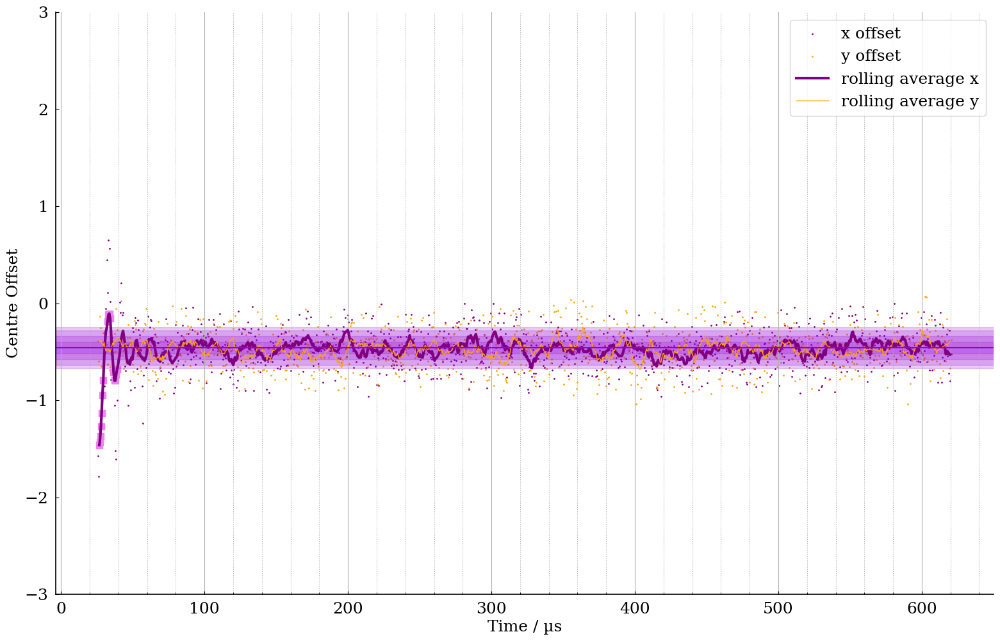

Calculated cut off (µs): 39.0
Is this cut off sensible? 

If yes, press enter. 

If no, enter a suggested value below (in µs):


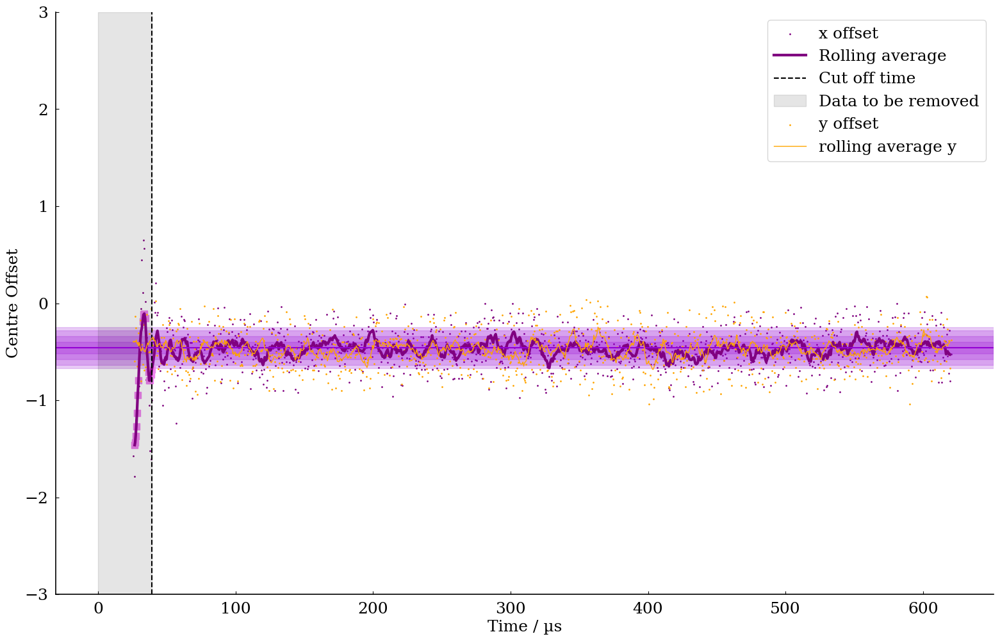

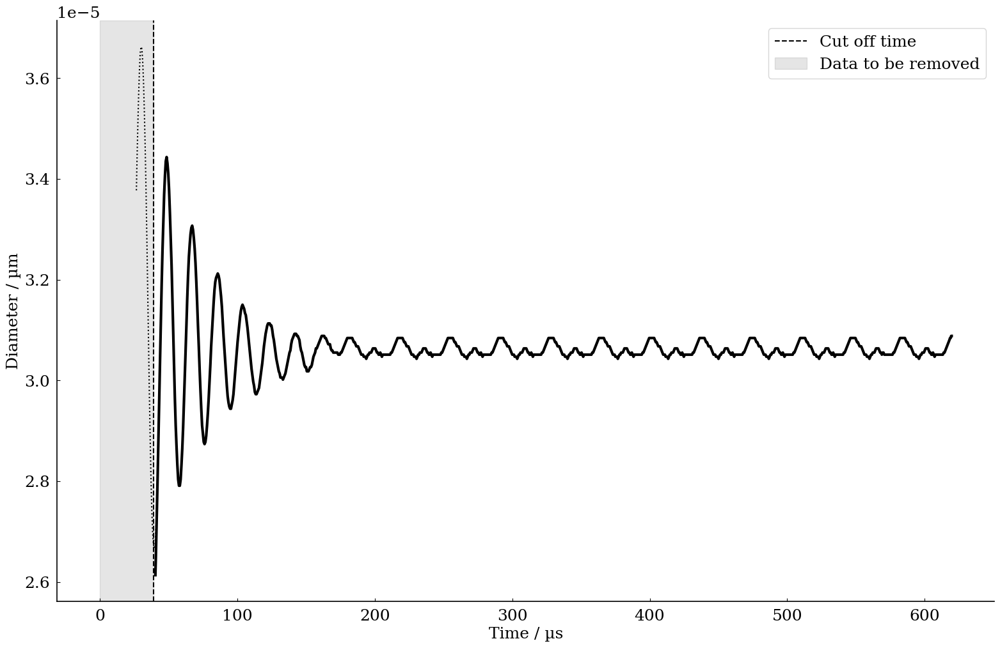

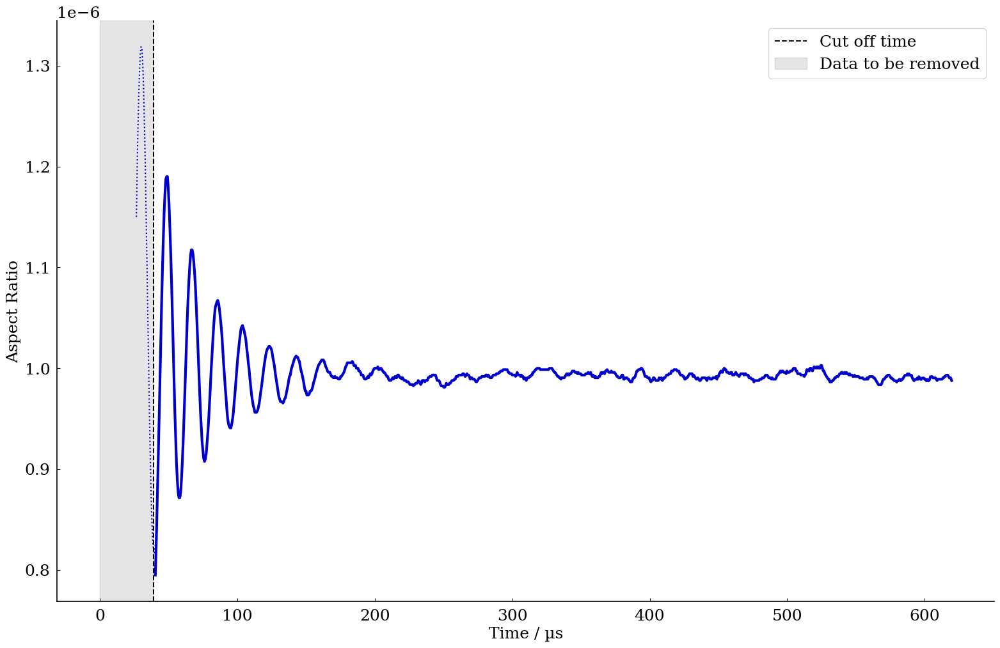

In [660]:

test_data = import_data('example surfactant aspect ratio.txt')
test_trimmed_data = review_centre_offset(test_data)

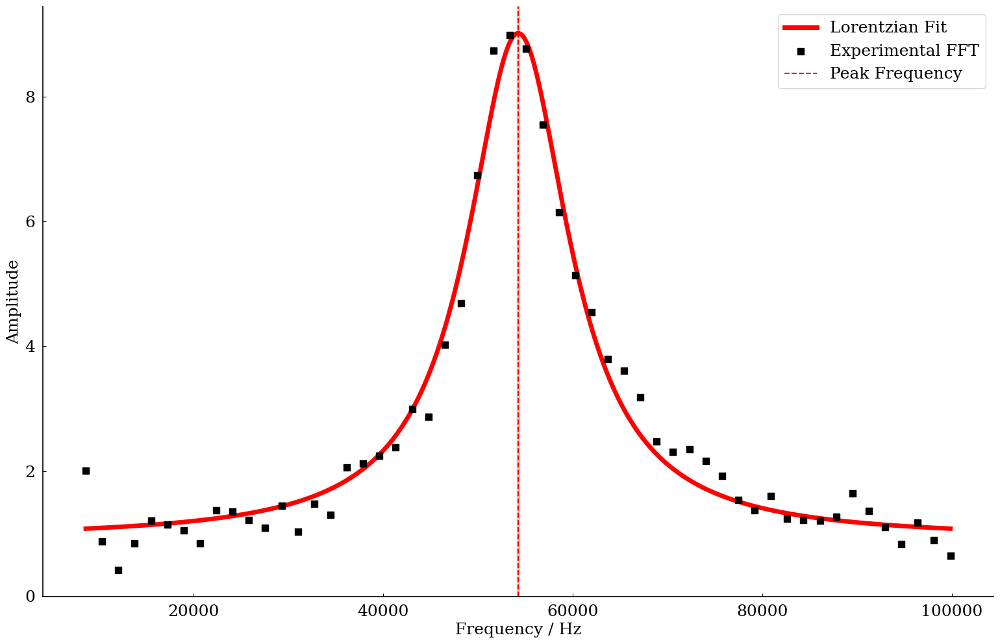

In [625]:
test_d_final, test_d_final_std, test_AR_final, test_d_correction, test_d_calibrated, test_A_0_estimate = get_calibrated_diameter(test_data)

_ = full_surface_tension_calculation(test_trimmed_data.time_s.values,
                                     test_trimmed_data.aspect_ratio.values,
                                     test_trimmed_data.diameter_um.tail(10).mean()/2e6,
                                     test_trimmed_data.diameter_um.tail(10).std()/2e6)

In [ ]:
When slicing 'example surfactant aspect ratio.txt' data, change the "smoothing_facotr

Complete


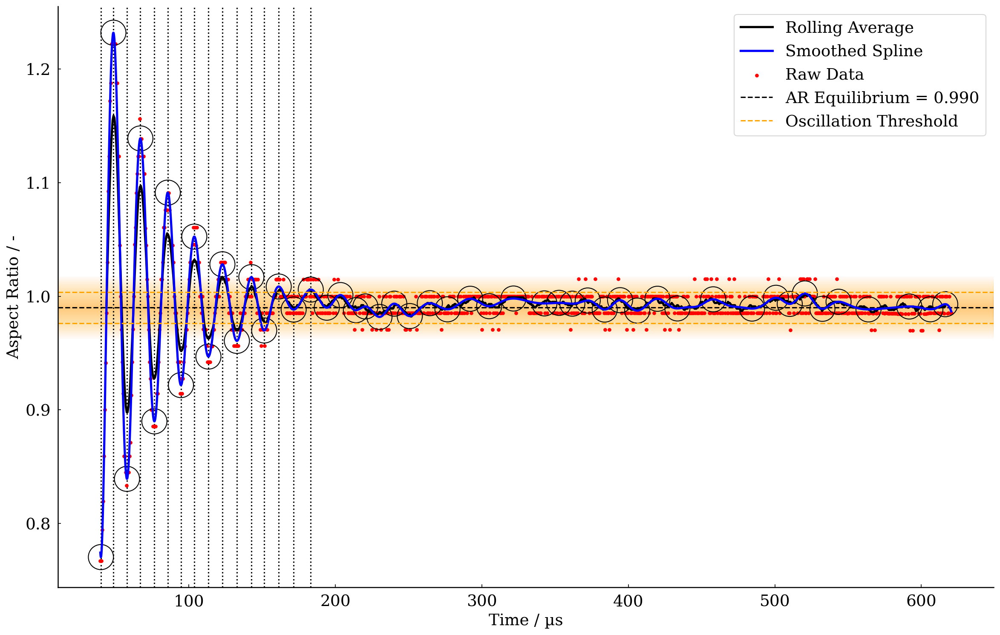

In [634]:
test_slice_times, test_sliced_data, test_settings_used = slice_data(test_trimmed_data)

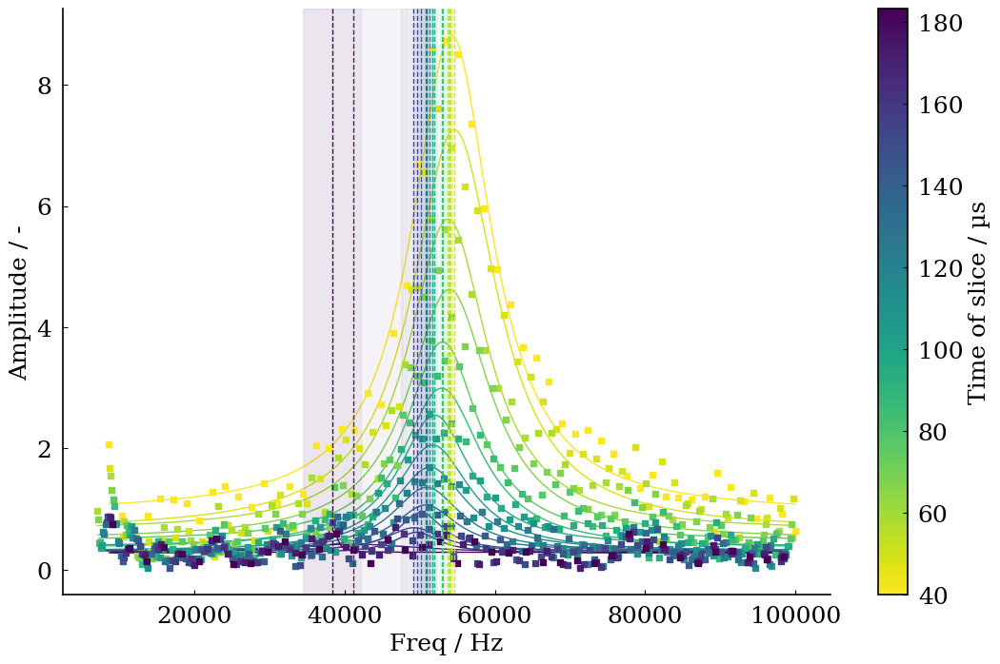

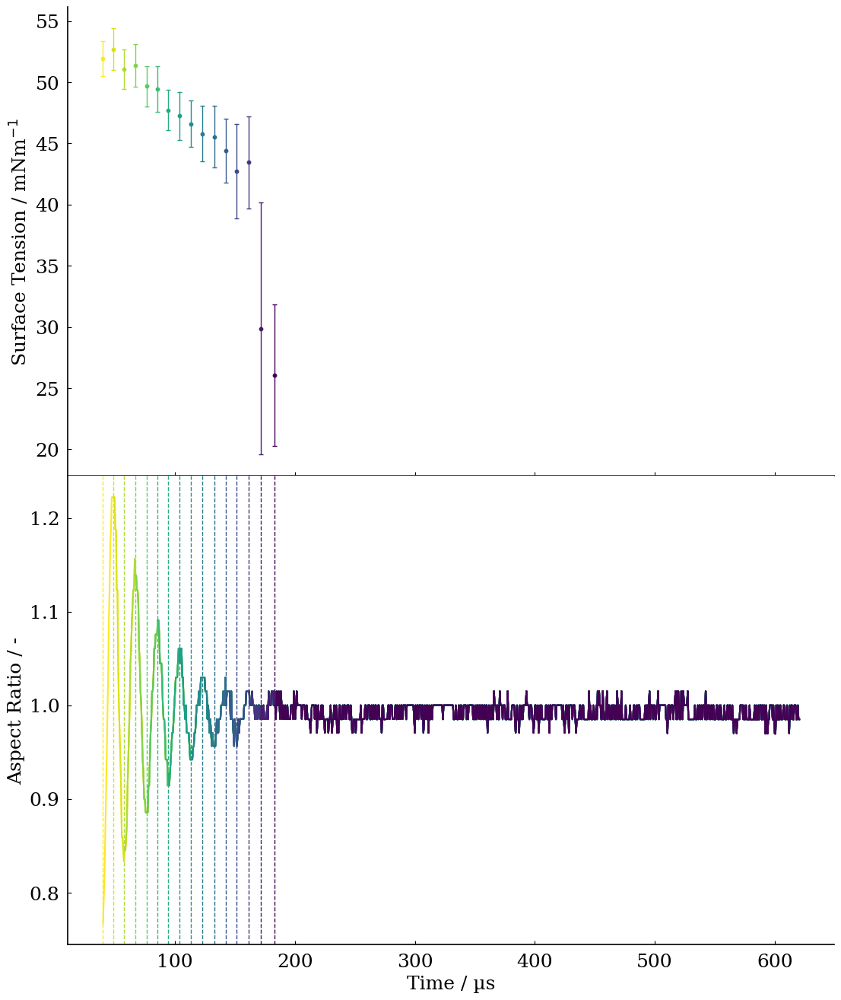

In [661]:
test_sigmas, test_sigma_errs, test_lors, test_ffts = chopped_surface_tension_calculations(test_sliced_data,
                                                                                          test_slice_times,
                                                                                          test_d_final/2,
                                                                                          test_d_final_std/2,)


# Modelling Oscillations

### Damping rate
dependent upon viscosity: rho

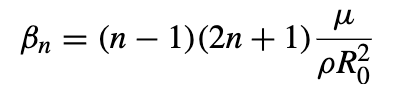

In [21]:
def beta_n(n , mu, rho, equilibrium_radius):
    
    """
    Calculation of Beta_n, the damping rate of oscillations.
    
    Args:
        n (int): mode order
        mu (float): dynamic viscosity of droplet in Pa.s
        rho (float): density of droplet in kg/m^3
        equilibrium_radius (float): in metres
        
    Returns:
        float:  the damping rate of oscillations.
    """
    
    B_n = (n - 1) * (2 * n + 1) * ( mu / (rho * equilibrium_radius ** 2))
    return B_n

### Oscillation eigenfrequency
dependent upon surface tension: sigma


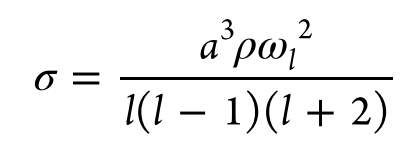

In [22]:
def omega_n_2(n , sigma, rho, equilibrium_radius):
    """
    Calculation of omega_l ^ 2, the square of the oscillation eignefrequency.
    
    Args:
        n (int): mode order
        sigma (float): surface tension of droplet in N/m
        rho (float): density of droplet in kg/m^3
        equilibrium_radius (float): in metres
        
    Return:
        float: the square of the oscillation eignefrequency.
    """    
    w_n_2 = (n*(n-1)*(n+2) * sigma) / (rho * (equilibrium_radius ** 3))

    return w_n_2 

### Mode coefficients
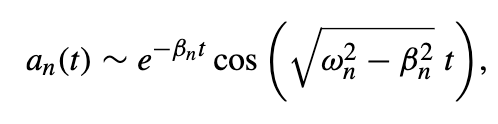

In [23]:
def alpha_n(t, B_n, w_n_2, A_0):
    
    """
    Calculation of time dependent mode coeficient with a given B_n and w_n_2 corresponding to a mode.
    
    Args:
        t (np.array): time series data
        B_n (float): the damping rate of oscillations
        w_n_2 (float): the square of the oscillation eignefrequency
        A_0 (float): the initial pertubation magnitude
        
    Returns:
        np.array: time-evolving mode coefficient
    """
    
    a_n = A_0 * np.exp(-B_n * t) * np.cos( np.sqrt(w_n_2 - B_n ** 2) * t)
    return a_n

## Testing Fundamental Equations

### Testing Parameters

In [622]:
test_time_max = 1e-4 #seconds

test_time_step = 1e-7

test_time_range = np.arange(0,test_time_max,test_time_step)

test_angles = np.arange(0, 2 * np.pi, np.pi /180)

test_A_0 = 1e-7

test_equilibrium_radius = 15e-6

test_mode_order_max = 4

### Mode Contributions

In [25]:
def plot_mode_contributions(equilibrium_radius, mode_order_max, A_0, test_time_range):

    sum_of_a_n = 0
    sum_of_envelope = 0

    for n in range(2,mode_order_max + 1):

        B_n_water = beta_n(n, mu_water(), rho_water(), equilibrium_radius)
        w_n_water = omega_n_2(n, sigma_water(), rho_water(), equilibrium_radius)

        a_n_range = alpha_n(test_time_range,
                            B_n_water,
                            w_n_water,
                            A_0) 

        plt.plot(test_time_range/1e-6,a_n_range, label = n)

        plt.plot(test_time_range/1e-6, A_0 * np.exp( - B_n_water * test_time_range), 'k:')
        plt.plot(test_time_range/1e-6, - A_0 * np.exp( - B_n_water * test_time_range), 'k:')

        sum_of_a_n += a_n_range
        sum_of_envelope += A_0 * np.exp( - B_n_water * test_time_range)

    plt.plot(test_time_range/1e-6, sum_of_a_n, 'k--', label = 'sum', zorder = 0)
    plt.plot(test_time_range/1e-6, sum_of_envelope, 'k:')
    plt.plot(test_time_range/1e-6, -sum_of_envelope, 'k:')

    plt.xticks([test_time_range.min() / 1e-6 ,(test_time_range.max()/1e-6) / 2,test_time_range.max()/1e-6])
    plt.xlabel('Time / µs')
    plt.ylabel('alpha_n')
    plt.legend()
    plt.ylim((mode_order_max - 1) * -A_0,(mode_order_max - 1) * A_0)
    plt.show()


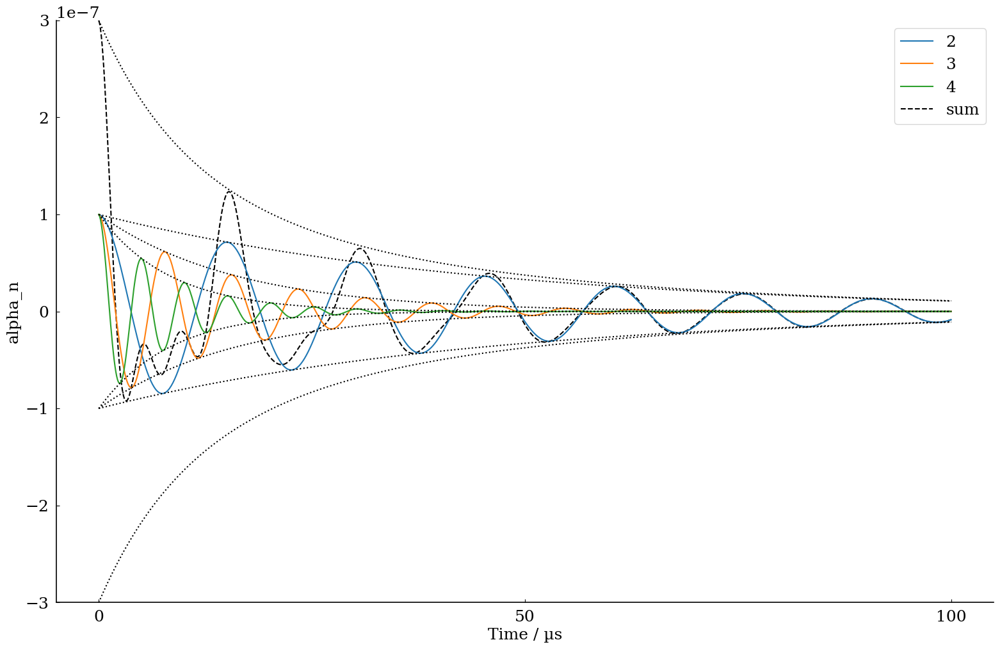

In [26]:
plot_mode_contributions(test_equilibrium_radius,
                        test_mode_order_max,
                        test_A_0,
                        test_time_range)

### Legendre Polynomials


In [27]:
def plot_legendre_polynomials(max_mode, min = -1, max = 1):

    """
    Demonstrates legendre polynomials
    """

    step = 0.01

    for n in range(max_mode):
        Pn = legendre(n)
        x = np.arange(min,max+step,step)
        y = Pn(x)
        plt.plot(x, y)
    plt.show()

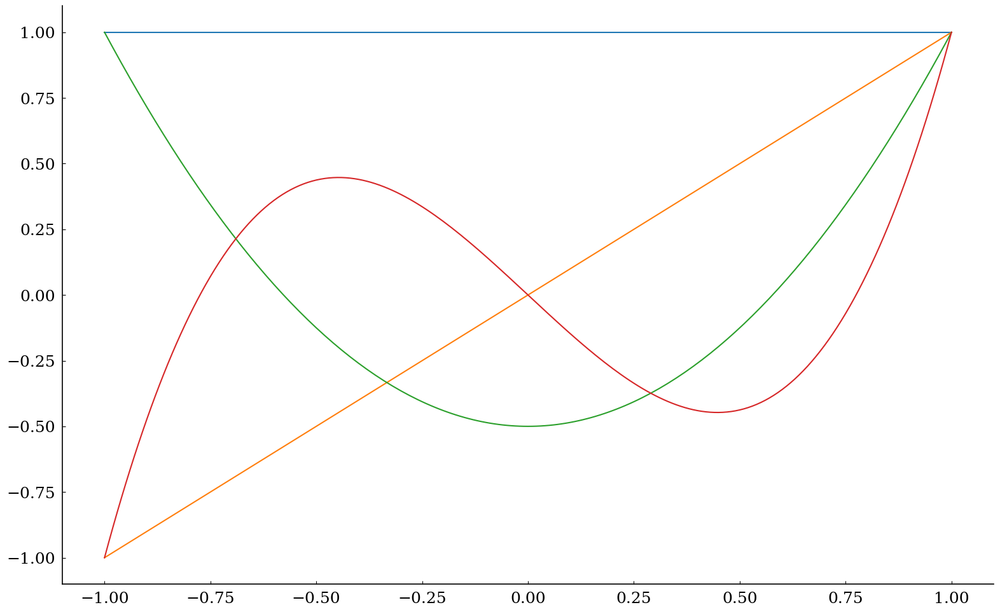

In [28]:
plot_legendre_polynomials(test_mode_order_max)

## Oscillations as a function of time and angle

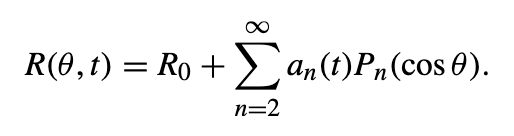

R as function of angle and time can now be expressed in ters of a_n and P_n terms

In [29]:
def R(time_range, angular_range, max_mode, R_0 = 15e-6, rho = rho_water(), mu = mu_water(), sigma = sigma_water(), A_0 = 2e-6):
    
    """
    Function that describes oscillations of droplets over time an angle.
    
    
    Args:
        time_range (np.array): time range over which to caluclate radius
        angular_range (np.array): angle range over which to caluclate radius
        max_mode (int): maximum mode order to be considered 
        R_0 (float): equilibrium radius in meters, default = 15 µm
        rho (float): density of droplet in kg/m^3. Default = density of water at 20 °C
        mu (float): dynamic viscosity of droplet in Pa.S. Default = dynamic viscosity of water at 20 °C
        sigma (float): Surface Tension of droplet in N/m. Default = Surface Tension of water at 20 °C
        A_0 (float): Initial oscilation magnitude. Default = 1e-6
        
    Returns:
        
    """
    
    
    mode_orders = np.arange(2,max_mode+1,1)
    mode_results = np.zeros((len(mode_orders),len(time_range),len(angular_range)))
     
    for idx,(mode_result, mode_order) in enumerate(zip(mode_results,mode_orders)):

        #mode order specific a_n as function of time, mu sigma, rho and R_0
        a_n = alpha_n(time_range,
                      beta_n(mode_order,mu, rho,R_0),
                      omega_n_2(mode_order, sigma, rho, R_0),
                      A_0)        
        
        #mode order specific P_n as function of angle
        P_n = legendre(mode_order)(np.cos(angular_range))
        
        #mode specific a_n*P_n: for each time in range there is an angular array of values
        mode_result = np.array([value * P_n for value in a_n])
        mode_results[idx] = mode_result
    
    mode_sum = np.sum(mode_results, axis=0)
    
    radial_profiles = R_0 + mode_sum
    single_mode_oscillations = R_0 + mode_results
    
    return radial_profiles, single_mode_oscillations

### Testing R function

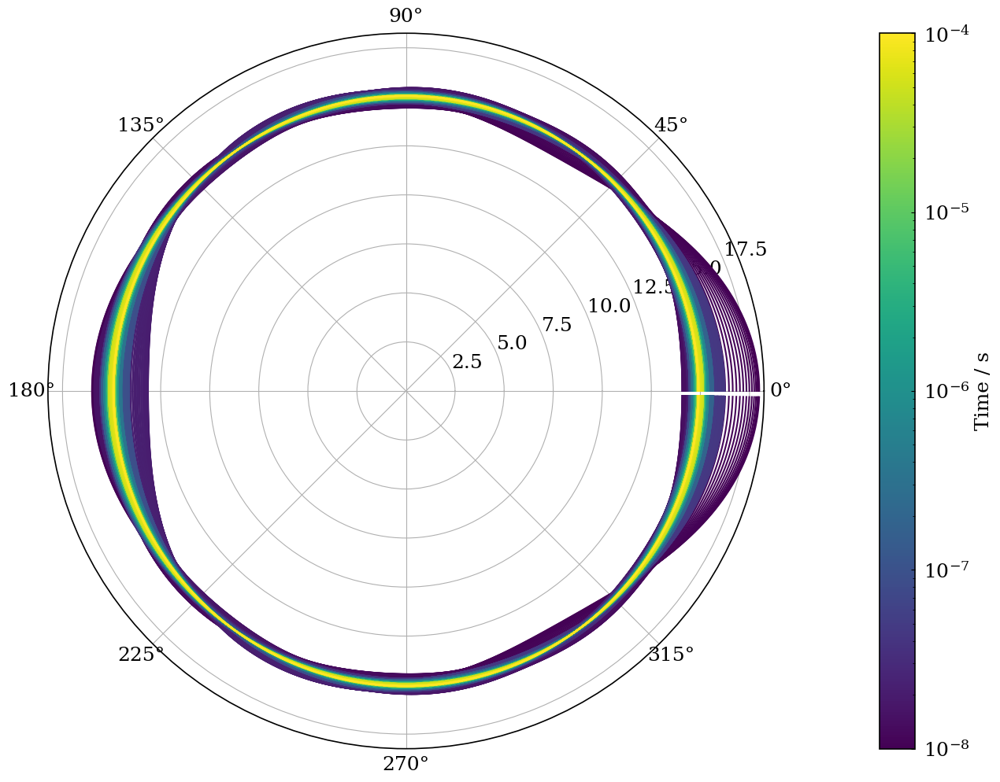

In [30]:
def plot_example_oscillation(time_range = test_time_range, angular_range = test_angles, max_mode = test_mode_order_max, R_0 = 15e-6, rho = rho_water(), mu = mu_water(), sigma = sigma_water(), A_0 = 1e-6):
    
    """
    Test function for plotting example figures
    Takes the same inputs as R() and simply produces a plot to demonstrate the output.
    """
    
    R_result = R(time_range, angular_range, max_mode, rho = rho, sigma = sigma, mu = mu, A_0 = A_0)
    
    max_display_plots = len(test_time_range)
    
    
    cmap = mpl.cm.viridis
    colors = cmap(np.linspace(0,1,max_display_plots))
  
    norm = mpl.colors.LogNorm(vmin=1e-8, vmax=max_display_plots * (time_range[1] - time_range[0]))

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})


    for i, time in enumerate(time_range):
        plt.plot(angular_range,R_result[0][i]/1e-6, color = colors[i])

    plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), label = 'Time / s', pad = 0.1)
    plt.show()

    return 

plot_example_oscillation()

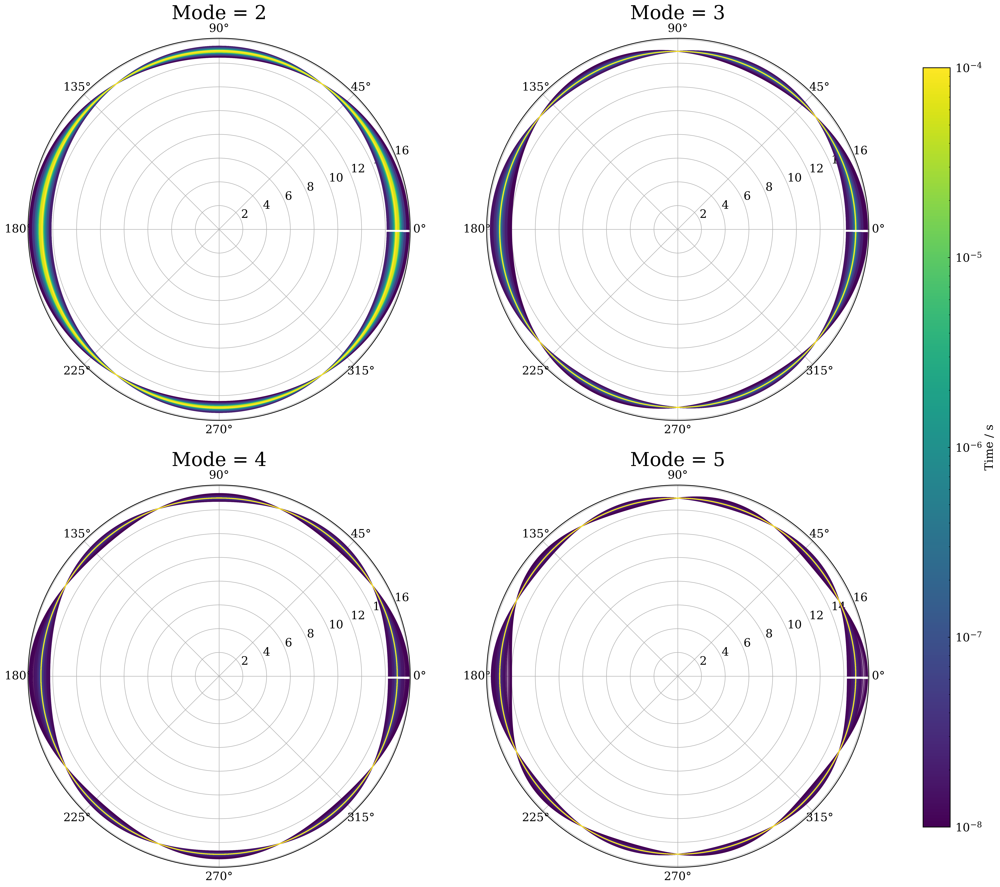

In [31]:
def plot_example_oscillation_mode_contributions(time_range = test_time_range, angular_range = test_angles, max_mode = test_mode_order_max, R_0 = 15e-6, rho = rho_water(), mu = mu_water(), sigma = sigma_water(), A_0 = 1e-6):
    
    """
    Test function for plotting example figures with individual mode contributions.
    Takes the same inputs as R() and simply produces a plot to demonstrate the output.
    """
    
    R_result = R(time_range, angular_range, max_mode, rho = rho, sigma = sigma, mu = mu, A_0 = A_0)
    
    max_display_plots = len(time_range)
    
    cmap = mpl.cm.viridis
    colors = cmap(np.linspace(0,1,max_display_plots))
  
    norm = mpl.colors.LogNorm(vmin=1e-8, vmax=max_display_plots * (time_range[1] - time_range[0]))
    
    # Configuring plot layout
    if (max_mode - 1)  % 2 == 0:
        columns = 2
        rows = int((max_mode - 1 ) / 2)
    else:
        columns = 1
        rows = int(max_mode - 1 )
        
    fig, axes = plt.subplots(rows, columns, subplot_kw={'projection': 'polar'}, figsize = (figure_height * columns,  figure_height * rows), dpi = resolution)
    if columns == 1:
        plt.subplots_adjust(hspace=0.15)
    else:
        plt.subplots_adjust(hspace=0.15, wspace=0.2)


    
    idx = 0
    for row in range(rows):
        if columns == 1:
            axes[row].set_title("Mode = {}".format(idx + 2), fontsize = 30)
            for i, time in enumerate(time_range):
                axes[row].plot(angular_range,R_result[1][idx][i]/1e-6, color = colors[i])
            idx = idx + 1
        else:
            for element in range(columns):
                axes[row][element].set_title("Mode = {}".format(idx + 2), fontsize = 30)
                for i, time in enumerate(time_range):
                    axes[row][element].plot(angular_range,R_result[1][idx][i]/1e-6, color = colors[i])
                idx = idx + 1
            
    cbar_ax = fig.add_axes([0.95, 0.15, 0.025, 0.7])
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),cax = cbar_ax, label = 'Time / s', pad = 0.2)

    plt.show()
    
    return 

plot_example_oscillation_mode_contributions(max_mode=5)
    

## Aspect Ratio

In [32]:
def aspect_ratio(time_range, max_mode_order=4, A_0 = 1e-6, rotation_angle = 0, rho = rho_water(), mu = mu_water(), sigma = sigma_water(), R_0 = 15e-6, vert_offset = 0):
    
    """
    Takes time_range, max mode order, rotation angle of droplet to bounding box, initial oscillation: A_0 and dropelt properties: iscosity, surface tension and R_0
    Returns R(0) / R(pi/2)
    
    Args:
        time_range (np.array): time range over which to perform calculations
        max_mode_order (int): default=4
        A_0 (float): Initial oscillation magnitude. Default = 1e-6
        rotation_angle (float): Angle at which to measure aspect ratio. Default = 0
        rho (float): Denisty of droplet in kg/m^3. Default = rho_water()
        mu (float): Dynamic viscosity of droplet in Pa.s. Default = mu_water()
        sigma (float): Surface tension of droplet in N/m. Default = sigma_water()
        R_0 (float): Equlibrium radius in m. Default = 15e-6
        vert_offset (float): Amount by which to shift aspect ratio vertically, useful when experimental data does not converge to 1. Default = 0

    Returns:
        np.array: Time evolution of aspect ratio with same shape as time_range
    
    """
    R_axis = R(time_range, np.array([0 + rotation_angle]), max_mode_order, rho = rho, mu = mu, sigma = sigma, A_0 = A_0, R_0 = R_0)
    R_perpendicular = R(time_range, np.array([np.pi/2 + rotation_angle]), max_mode_order, rho = rho, mu = mu, sigma = sigma, A_0 = A_0, R_0 = R_0)
    
    return (R_axis[0]/R_perpendicular[0]) + vert_offset


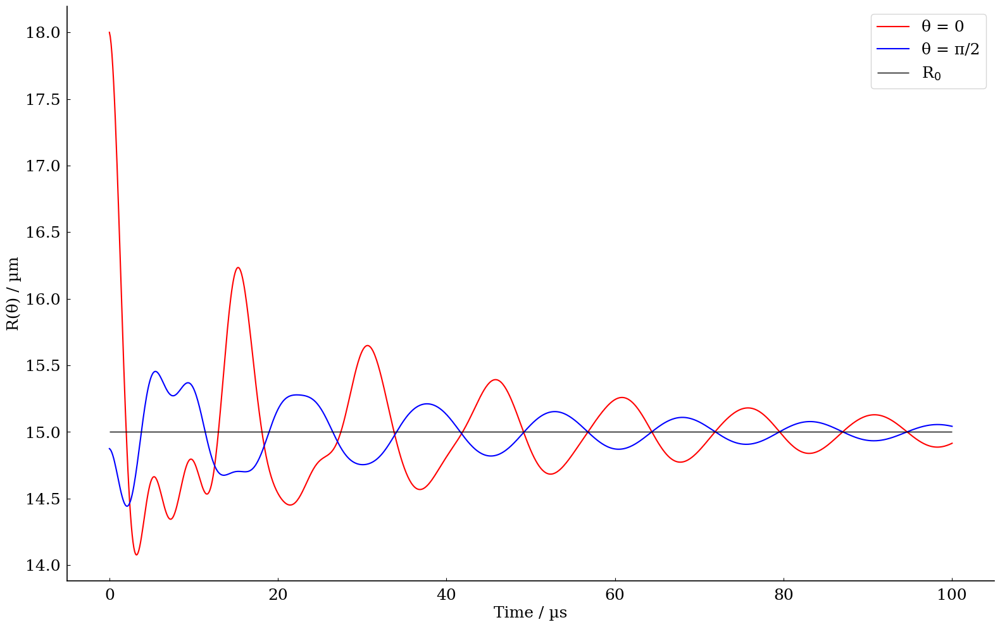

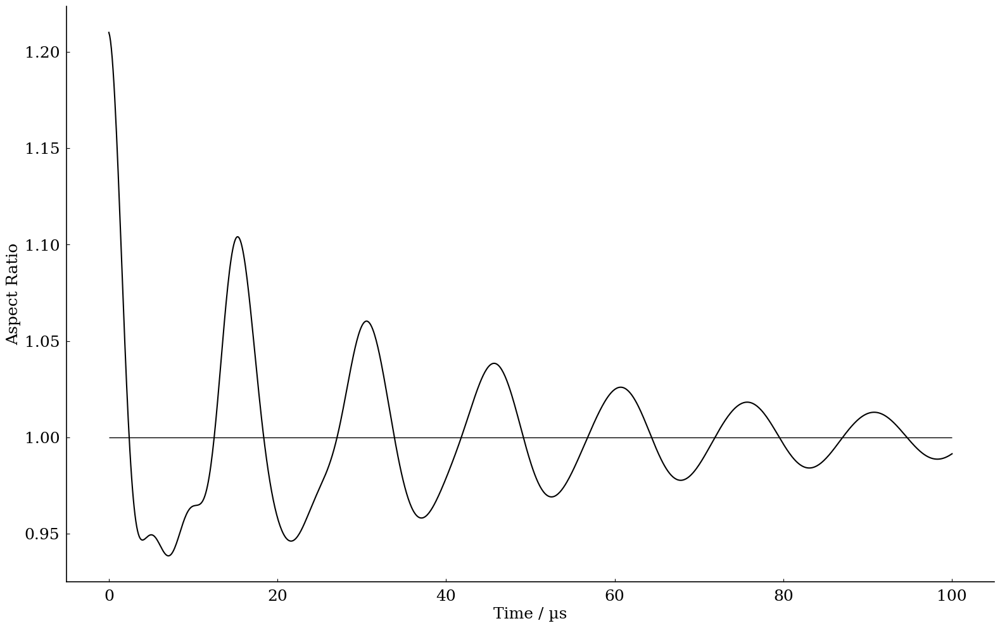

In [33]:
def plot_example_aspect_ratio(time_range = test_time_range, max_mode_order=4, A_0 = 1e-6, rotation_angle = 0,rho = rho_water(), mu = mu_water(), sigma = sigma_water(), R_0 = 15e-6, vert_offset = 0):
    
    """
    Test function for plotting example figures of aspect ratio
    Takes the same inputs as aspect ratio() and simply produces a plot to demonstrate the output.
    """
    
    R_axis = R(time_range, np.array([0 + rotation_angle]), max_mode_order, rho = rho, mu = mu, sigma = sigma, A_0 = A_0, R_0 = R_0)
    R_perpendicular = R(time_range, np.array([np.pi/2 + rotation_angle]), max_mode_order, rho = rho, mu = mu, sigma = sigma, A_0 = A_0, R_0 = R_0)

    #axis oscillation
    plt.plot(time_range/1e-6, R_axis[0]/ 1e-6, label = 'θ = 0', color = "r")

    #perpendicular oscillation
    plt.plot(time_range/1e-6, R_perpendicular[0] / 1e-6, label = 'θ = π/2', color = "b")

    #equilibrium radius line
    plt.hlines(R_0/1e-6,test_time_range.min()/1e-6, test_time_range.max()/1e-6, 'k', lw = 1, label = 'R$_0$')

    plt.ylabel('R(θ) / µm')
    plt.xlabel('Time / µs')
    plt.legend()
    plt.show()

    #Aspect ratio
    plt.plot(time_range/1e-6, R_axis[0] / R_perpendicular[0], 'k')

    plt.ylabel('Aspect Ratio')
    plt.xlabel('Time / µs')

    #Equilibrium aspect ratio line
    plt.hlines(1,time_range.min()/1e-6, time_range.max()/1e-6, 'k', lw = 1)

    plt.show()
    
    return

plot_example_aspect_ratio()

In [34]:
def normalise_for_plotting(myrange):
    '''for scaling a range for plotting'''

    my_scaled_range = (myrange - myrange.min()) / (myrange.max() - myrange.min())
    
    return my_scaled_range

## Impact of each paraameter upon the aspect ratio output

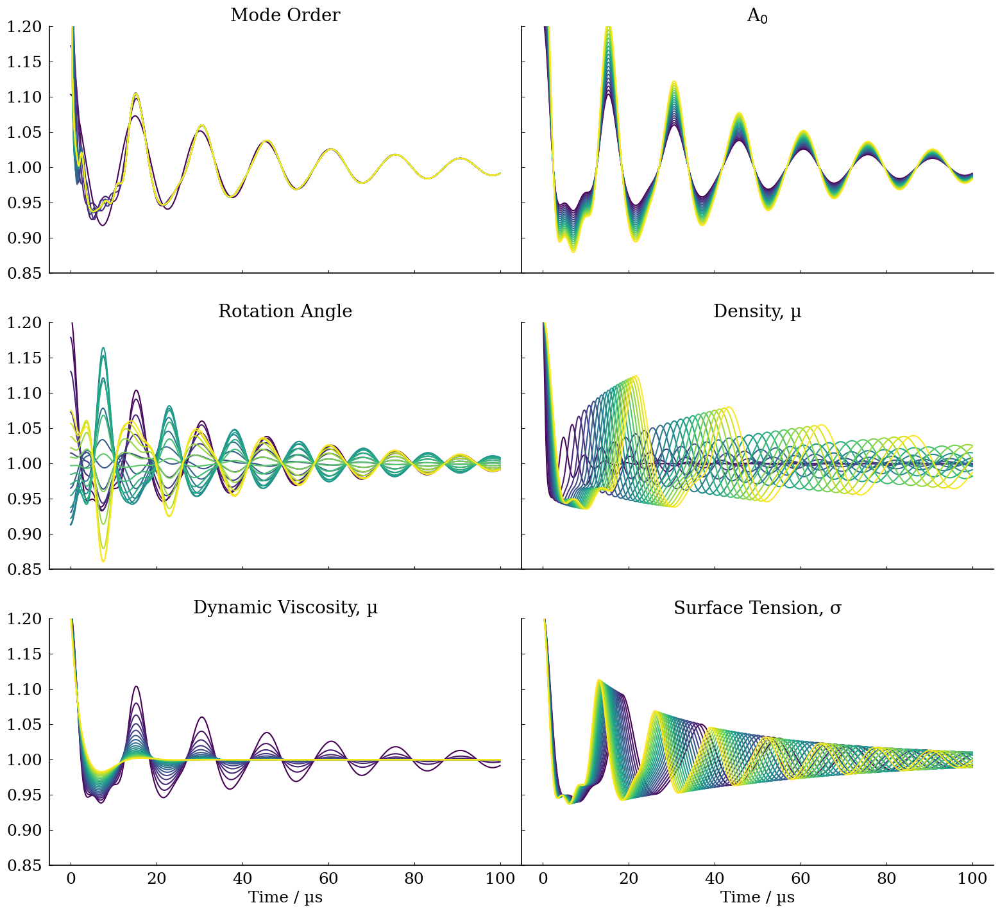

In [36]:
def plot_example_parameter_effects():
    
    fig = plt.figure(figsize = (19,17))
    gs = fig.add_gridspec(3, 2,hspace=0.2, wspace=0.0)

    ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = gs.subplots(sharex='col', sharey = 'row')

    #fig = plt.figure()
    #gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
    #(ax1, ax2), (ax3, ax4) = gs.subplots(sharex='col', sharey='row')

    #fig.suptitle('Varying each parameter in the aspect ration function')

    number_of_values_to_plot = 20

    mode_orders = np.arange(2, 2+ number_of_values_to_plot, 1)
    A_0s = np.linspace(1e-6,2e-6, number_of_values_to_plot)
    angles = np.linspace(0,np.pi, number_of_values_to_plot)
    rhos = np.linspace(100,2000,number_of_values_to_plot)
    mus = np.linspace(1e-3,10e-3,number_of_values_to_plot)
    sigmas = np.linspace(50e-3, 100e-3, number_of_values_to_plot)
    #R_0s = np.linspace(10e-6, 200e-6, number_of_values_to_plot)

    cmap = mpl.cm.viridis
    colours = cmap(normalise_for_plotting(np.linspace(0,1,number_of_values_to_plot)))
    y_plot_max = 1.15


    for value, colour in zip(mode_orders, colours):
        ax1.plot(test_time_range/1e-6,aspect_ratio(test_time_range,max_mode_order = value), c = colour)
        ax1.set_title("Mode Order", fontsize = 20)
        ax1.hlines(1,test_time_range.min(), test_time_range.max(), 'k', lw = 1)
        ax1.set_ylim(0.85,1.2)

    for value, colour in zip(A_0s, colours):
        ax2.plot(test_time_range/1e-6,aspect_ratio(test_time_range,A_0 = value), c = colour)
        ax2.set_title("A$_0$", fontsize = 20)
        ax2.hlines(1,test_time_range.min(), test_time_range.max(), 'k', lw = 1)
        ax2.set_ylim(0.85,1.2)

    for value, colour in zip(angles, colours):
        ax3.plot(test_time_range/1e-6,aspect_ratio(test_time_range,rotation_angle = value), c = colour)
        ax3.set_title("Rotation Angle", fontsize = 20)
        ax3.hlines(1,test_time_range.min(), test_time_range.max(), 'k', lw = 1)
        ax3.set_ylim(0.85,1.2)

    for value, colour in zip(rhos, colours):
        ax4.plot(test_time_range/1e-6,aspect_ratio(test_time_range,rho = value), c = colour)
        ax4.set_title("Density, µ", fontsize = 20)
        ax4.hlines(1,test_time_range.min(), test_time_range.max(), 'k', lw = 1)
        ax4.set_ylim(0.85,1.2)
        
    for value, colour in zip(mus, colours):
        ax5.plot(test_time_range/1e-6,aspect_ratio(test_time_range,mu = value), c = colour)
        ax5.set_title("Dynamic Viscosity, µ", fontsize = 20)
        ax5.hlines(1,test_time_range.min(), test_time_range.max(), 'k', lw = 1)
        ax5.set(xlabel = 'Time / µs')
        ax5.set_ylim(0.85,1.2)

    for value, colour in zip(sigmas, colours):
        ax6.plot(test_time_range/1e-6,aspect_ratio(test_time_range,sigma = value), c = colour)
        ax6.set_title("Surface Tension, σ", fontsize = 20)
        ax6.hlines(1,test_time_range.min(), test_time_range.max(), 'k', lw = 1)
        ax6.set(xlabel = 'Time / µs')
        ax6.set_ylim(0.85,1.2)

    '''for value, colour in zip(R_0s, colours):
        ax7.plot(test_time_range/1e-6,aspect_ratio(test_time_range,R_0 = value), c = colour)
        ax7.set_title("R$_0$")
        ax7.hlines(1,test_time_range.min(), test_time_range.max(), 'k', lw = 1)
        ax7.set(xlabel = 'Time / µs')
        ax7.set_ylim(0.85,1.2)'''
        
    return
    
plot_example_parameter_effects()

# Fitting Droplet Osilations

## Fitting Diameter

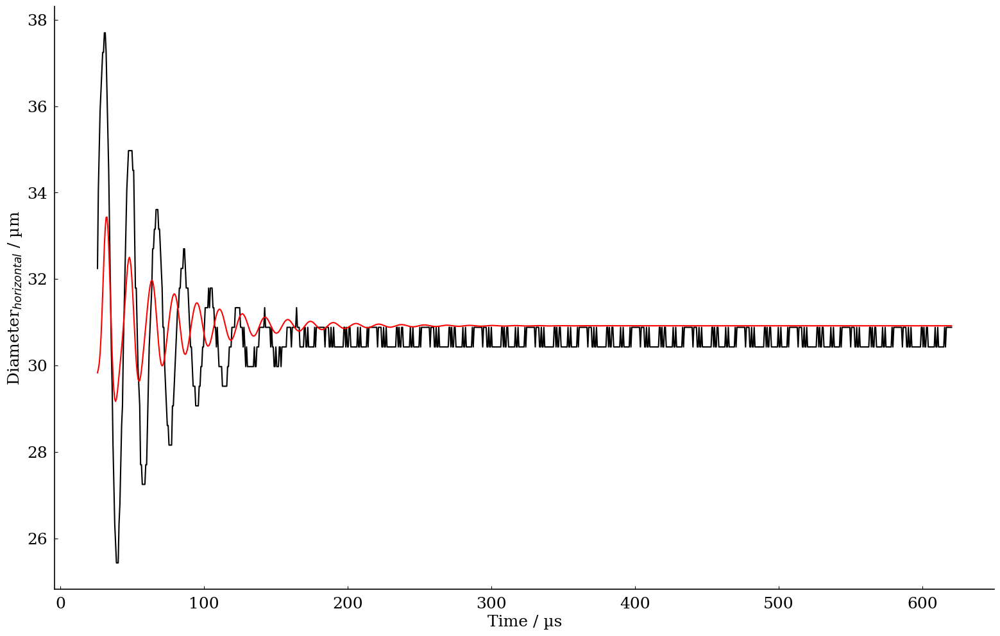

t_offset = 0.0, R_0 = 15.45917040888084, mu = 0.0010015968546230219, sigma = 72.73614042160757, A_0 = 2e-06
t_offset = 0.0, R_0 = 15.45917040888084, mu = 0.0010015968546230219, sigma = 72.73614042160757, A_0 = 2e-06


In [388]:
def d_fitting_func(time_range, t_offset, R_0, mu, sigma, A_0):
    """
    Function for fitting of diameter vs time simulation.
    """
    
    max_mode = 3
    
    return 2* R(time_range = time_range + t_offset,
                angular_range = np.array([0]),
                max_mode = max_mode,
                R_0 = R_0,
                mu = mu,
                sigma = sigma,
                A_0 = A_0)[0].flatten()
             


def get_diameter_fit(df,
                     lower_bounds = [-500e-6, 1e-6, 0.1e-3, 10e-3, 0.9e-6],
                     upper_bounds = [500e-6, 200e-6, 1.5e-3, 200e-3, 100e-6]):
    
    '''Takes experimental data in df, bounds and staring guss in format: 
    [t_offset, R_0, mu, sigma, A_0]
    Returns diameter parameters and associated errors'''

    starting_parameters = [0, get_calibrated_diameter(df)[4]/2, mu_water(), sigma_water(), 2e-6]

    dpopt, dpcov = curve_fit(d_fitting_func,
                             df.time_s,
                             df.diameter_um * 1e-6,
                             p0 = starting_parameters,
                             bounds = (lower_bounds,
                                       upper_bounds))
    fig, ax = plt.subplots()
    ax.plot(df.time_s/1e-6, df.diameter_um, color = "k")
    ax.plot(df.time_s/1e-6, d_fitting_func(df.time_s, *dpopt)/1e-6, color = "r")
    
    ax.set_ylabel('Diameter$_{horizontal}$ / µm')
    ax.set_xlabel('Time / µs')

    #ax.plot(df.time_s/1e-6, d_fitting_func(df.time_s, *starting_parameters)/1e-6, color = "b")

    
    plt.show()
    
    print ("t_offset = {}, R_0 = {}, mu = {}, sigma = {}, A_0 = {}".format(starting_parameters[0]/1e-6,
                                                                           starting_parameters[1]/1e-6,
                                                                           starting_parameters[2]/1,
                                                                           starting_parameters[3]/1e-3,
                                                                           starting_parameters[4]/1,))
    
    print ("t_offset = {}, R_0 = {}, mu = {}, sigma = {}, A_0 = {}".format(dpopt[0]/1e-6,
                                                                           dpopt[1]/1e-6,
                                                                           dpopt[2]/1,
                                                                           dpopt[3]/1e-3,
                                                                           dpopt[4]/1,))
    return dpopt, np.sqrt(np.diag(dpcov))


test_diameter_parameters, test_diameter_parameters_errors = get_diameter_fit(test_data)



## Fitting Aspect Ratio

In [637]:



#test_AR_offset = get_calibrated_diameter(test_data)[0]

def aspect_fitting_func(t, t_offset, mu, sigma, A_0, vertical_offset):
    'Parameters: t: time series, vertical_offset, t_offset: time offset, sigma: surface tension, A_0 '

    max_mode = 3

    return aspect_ratio(t + t_offset,
                        sigma= sigma,
                        mu = mu,
                        A_0= A_0,
                        max_mode_order = max_mode,
                        vert_offset = vertical_offset).flatten()
def get_aspect_ratio_fit(df,
                         starting_parameters = [0, mu_water(), sigma_water(), 10e-6, 0],        
                         lower_bounds = [-1, 0.2e-3, 10e-3, -50e-6, -0.25],
                         upper_bounds = [1, 5e-3, 100e-3, 50e-6, 0.25]):
    '''Takes experimental data in df, bounds and staring guess in format: 
    [rotatation angle, R_0, viscosity, surface tension, A_0]
    Returns diameter parameters and associated errors
    
    example starting parameters
    starting_parameters = [0, mu_water(), sigma_water(), 10e-6, 0],        
    lower_bounds = [-1, 0.2e-3, 10e-3, -50e-6, -0.25],
    upper_bounds = [1, 5e-3, 100e-3, 50e-6, 0.25]
    '''
    
        
    apopt, apcov = curve_fit(aspect_fitting_func,
                             df.time_s,
                             df.aspect_ratio,
                             p0 = starting_parameters,
                             bounds = (lower_bounds,
                                       upper_bounds))
    return apopt, np.sqrt(np.diag(apcov))

In [638]:
def sigma_exponetial(t, lower_limit, amplitude, time_period):
    """
    Function for fitting exponential surface tension decay
    """
    return lower_limit + amplitude*np.exp(-(t)/time_period)

def aspect_ratio_dynamic(time_range,
                         max_mode_order=4,
                         lower_limit = 35e-3,
                         amplitude = 0.015,
                         time_period = 0.0001,
                         A_0 = 1e-6,
                         rotation_angle = 0,
                         rho = rho_water(),
                         mu = mu_water(),
                         R_0 = 15e-6,
                         vert_offset = 0):
    
    """
    Takes time_range, max mode order, rotation angle of droplet to bounding box, initial oscillation: A_0 and dropelt properties: iscosity, surface tension and R_0
    Returns R(0) / R(pi/2)
    
    Args:
        time_range (np.array): time range over which to perform calculations
        max_mode_order (int): default=4
        t_offset (float): time offset of result to align fit and experiment
        lower_limit (float): of surface tension exponential function
        amplitude (float): of surface tension exponential function
        time_period (float): of surface tension exponential function
        A_0 (float): Initial oscillation magnitude. Default = 1e-6
        rotation_angle (float): Angle at which to measure aspect ratio. Default = 0
        rho (float): Denisty of droplet in kg/m^3. Default = rho_water()
        mu (float): Dynamic viscosity of droplet in Pa.s. Default = mu_water()
        sigma (float): Surface tension of droplet in N/m. Default = sigma_water()
        R_0 (float): Equlibrium radius in m. Default = 15e-6
        vert_offset (float): Amount by which to shift aspect ratio vertically, useful when experimental data does not converge to 1. Default = 0

    Returns:
        np.array: Time evolution of aspect ratio with same shape as time_range
    
    """
    
    sigma = sigma_exponetial(time_range,
                             lower_limit= lower_limit,
                             amplitude = amplitude,
                             time_period = time_period)
    
    R_axis = R(time_range, np.array([0 + rotation_angle]), max_mode_order, rho = rho, mu = mu, sigma = sigma, A_0 = A_0, R_0 = R_0)
    R_perpendicular = R(time_range, np.array([np.pi/2 + rotation_angle]), max_mode_order, rho = rho, mu = mu, sigma = sigma, A_0 = A_0, R_0 = R_0)
    
    return (R_axis[0]/R_perpendicular[0]) + vert_offset

def aspect_ratio_dynamic_fitting_function(t, t_offset, A_0, vert_offset, lower_limit, amplitude, time_period ):
    '''funtion with variables for fitting. time offset, A_0, sigma lower and upper bounds and decay time period'''
    
    mode_order = 3
    
    return aspect_ratio_dynamic(t + t_offset,
                                max_mode_order=mode_order,
                                lower_limit = lower_limit, 
                                amplitude = amplitude,
                                time_period = time_period,
                                A_0=A_0,
                                vert_offset = vert_offset).flatten()
    

In [644]:
def get_dynamic_aspect_ratio_fit(df,
                                 starting_parameters = [0, 0, 0, 0.038, 0.0225, 1e-4],
                                 lower_bounds = [-750e-6, -100,  -0.25, 0.01, 0.001, 0.0001],
                                 upper_bounds = [750e-6, 100,  0.25, 100 , 0.5, 0.05]):

    """
    Params that work for test surfactant
    """

    dsigpopt, dsigpcov = curve_fit(aspect_ratio_dynamic_fitting_function,
                                                       df.time_s,
                                                       df.aspect_ratio,
                                                       p0 = starting_parameters,
                                                       bounds = (lower_bounds,
                                                                 upper_bounds))
    return dsigpopt, np.sqrt(np.diag(dsigpcov))


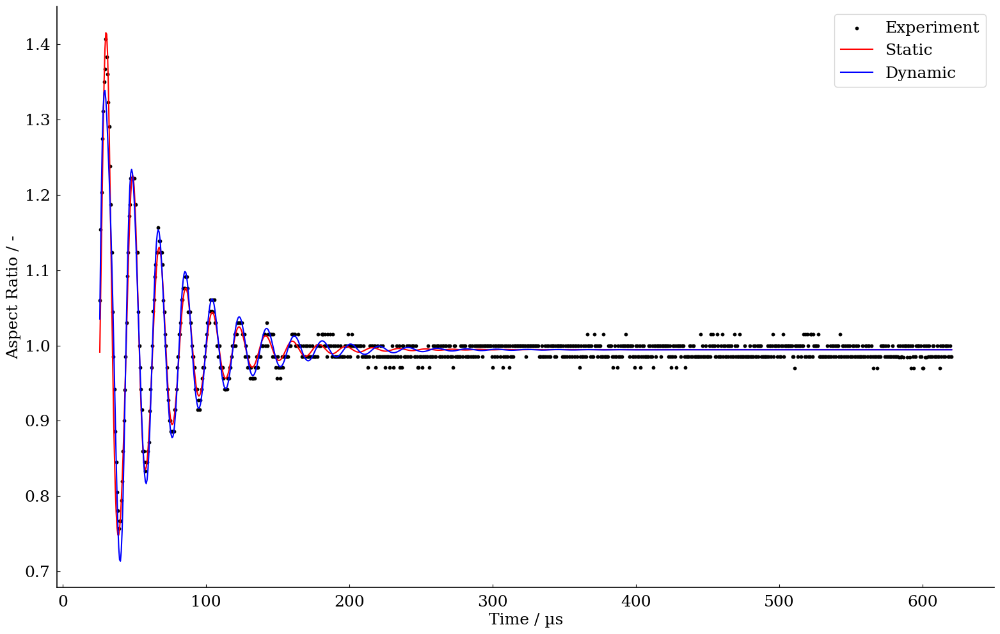

In [655]:



test_aspect_ratio_parameters, test_aspect_ratio_parameters_errors = get_aspect_ratio_fit(test_data)
test_dynamic_sigma_popt, test_dynamic_sigma_errors = get_dynamic_aspect_ratio_fit(test_data)

test_params = [-3.67365470e-06, -6.17478303e-06, -5.76994826e-03,  1.00000133e-02 ,4.25952605e-02,  1.1e-03]

plt.scatter(test_data.time_s/1e-6, test_data.aspect_ratio, color = "k", s = 10, label = "Experiment")
plt.plot(test_data.time_s/1e-6, aspect_fitting_func(test_data.time_s, *test_aspect_ratio_parameters), color = "r", label = "Static")
plt.plot(test_data.time_s/1e-6, aspect_ratio_dynamic_fitting_function(test_data.time_s, *test_dynamic_sigma_popt), color = "b", label = "Dynamic")
#plt.plot(test_data.time_s, aspect_ratio_dynamic_fitting_function(test_data.time_s, *test_params), color = "g", label = "Fixed")
plt.xlabel("Time / µs")
plt.ylabel("Aspect Ratio / -")

plt.legend()
plt.show()


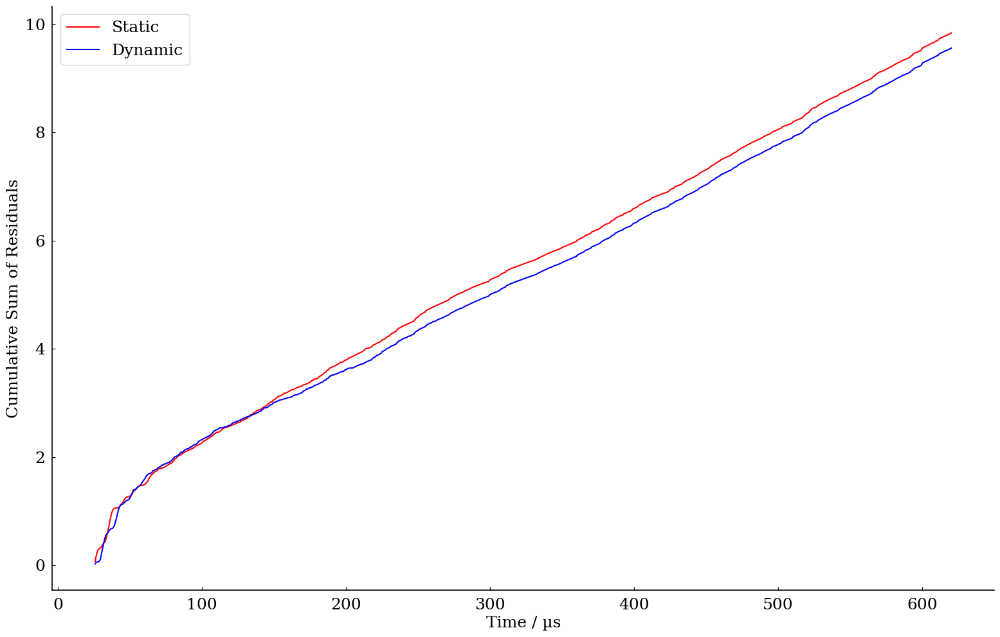

In [656]:
plt.plot(test_data.time_s/1e-6, np.cumsum(np.abs(aspect_fitting_func(test_data.time_s, *test_aspect_ratio_parameters) - test_data.aspect_ratio)), color = "r", label = "Static")
plt.plot(test_data.time_s/1e-6, np.cumsum(np.abs(aspect_ratio_dynamic_fitting_function(test_data.time_s, *test_dynamic_sigma_popt) - test_data.aspect_ratio)), color = "b", label = "Dynamic")
#plt.plot(test_data.time_s, np.cumsum(np.abs(aspect_ratio_dynamic_fitting_function(test_data.time_s, *test_params) - test_data.aspect_ratio)), color = "g", label = "Fixed")
plt.xlabel("Time / µs")
plt.ylabel("Cumulative Sum of Residuals")

plt.legend()
plt.show()




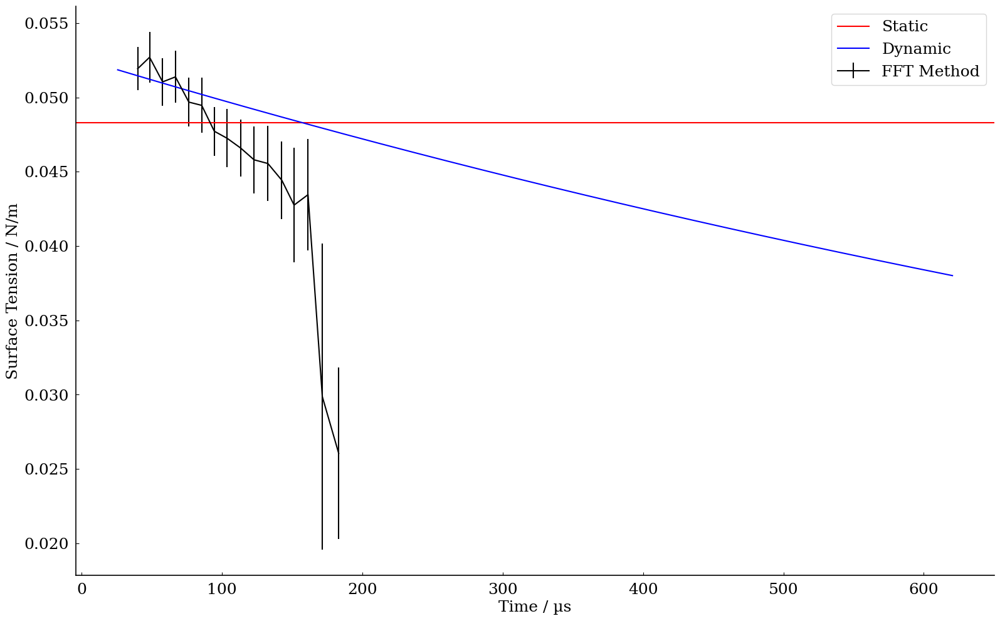

In [658]:
plt.errorbar(test_slice_times/1e-6, test_sigmas, yerr=test_sigma_errs, color = "k",  label = "FFT Method")
plt.axhline(test_aspect_ratio_parameters[2], color = "r", label = "Static")
plt.plot(test_data.time_s/1e-6, sigma_exponetial(test_data.time_s,*test_dynamic_sigma_popt[3::]), color = 'b', label = "Dynamic")
#plt.plot(test_slice_times, sigma_exponetial(test_slice_times,*test_params[3::]), color = 'g')
plt.xlabel("Time / µs")
plt.ylabel("Surface Tension / N/m")
plt.legend()
plt.show()

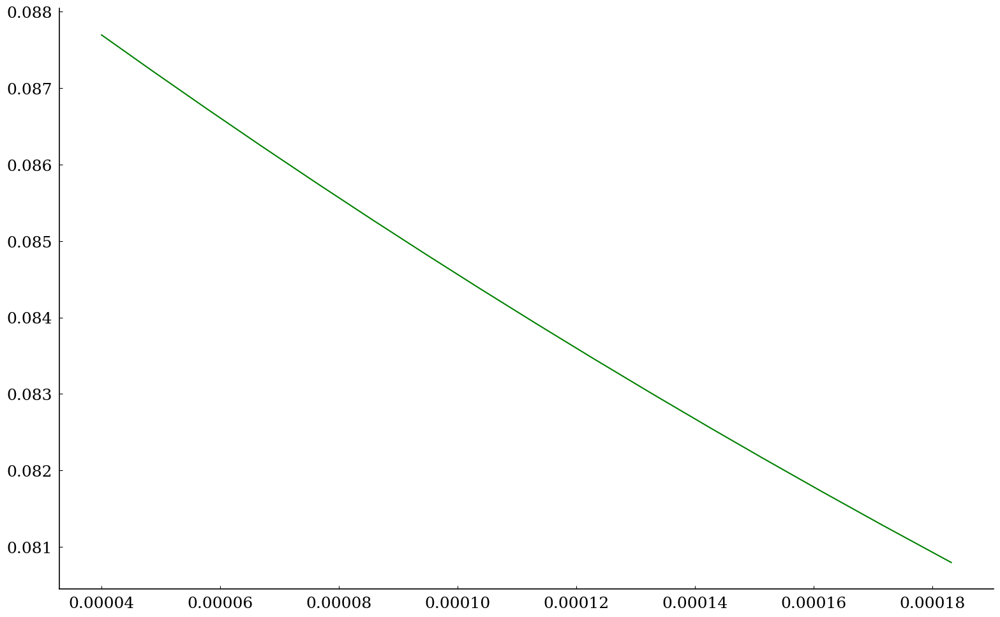

In [646]:
test_params = [-3.67365470e-06, -6.17478303e-06, -5.76994826e-03,  6e-2 ,3e-2,  0.5e-03]

plt.plot(test_slice_times, sigma_exponetial(test_slice_times,*test_params[3::]), color = 'g')
#plt.ylim(0,0.073)

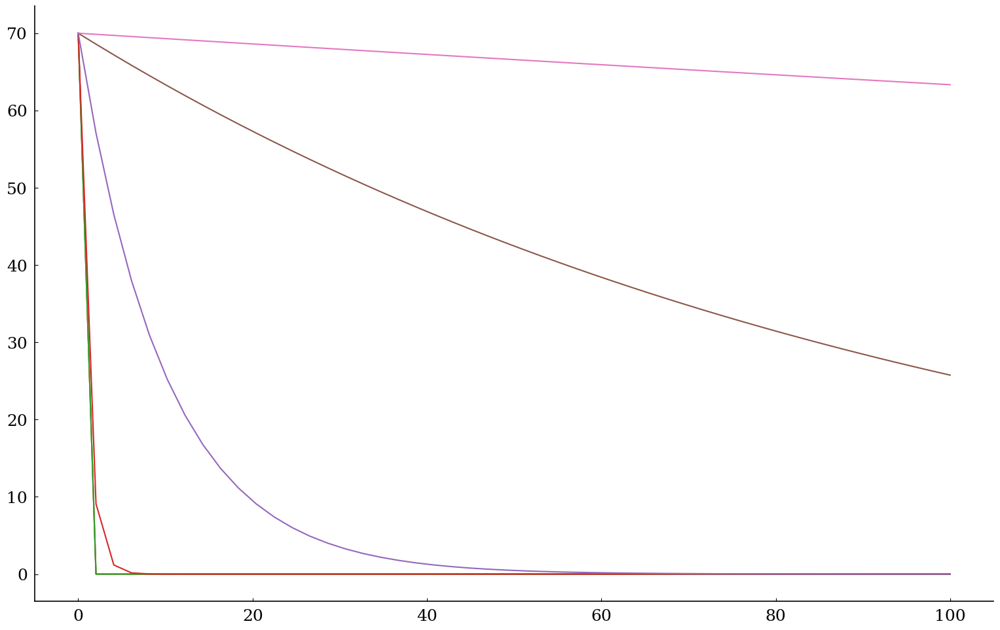

In [621]:
def test_sigma_exponetial(t, upper_limit, a, time_period):
    return upper_limit * np.exp(-(t)/time_period)
for tau in np.logspace(-3,3,7):
    plt.plot(np.linspace(0,100), test_sigma_exponetial(np.linspace(0,100),
                                                   70,
                                                   1,
                                                   tau))
